In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import joblib
import json

In [2]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Ridge
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.base import clone

In [3]:
import warnings
warnings.filterwarnings('ignore')

# **Funciones de carga y limpieza del dataset del Arduino 2**

**Cargar los datos de los 3 ficheros de Arduinos**

In [4]:
# Función para cargar datos de Arduino
def cargar_arduino(filepath, nombre_arduino):
    # Leer todo el fichero como texto para limpiarlo
    df = pd.read_csv(
        filepath,
        sep=';',
        header=None,
        dtype=str,
        encoding='latin-1',
        on_bad_lines='skip'
    )

    # Buscar filas que contienen la cabecera real
    mask_header = df[0].str.contains('FECHA', na=False)

    # Obtener los nombres de columnas de la primera cabecera encontrada
    if mask_header.any():
        header_idx = mask_header.idxmax()
        column_names = df.iloc[header_idx].tolist()
    else:
        raise ValueError(f"No se encontró cabecera válida en {filepath}")

    # Intentar convertir a datetime, lo que no sea fecha queda como NaT
    df['datetime'] = pd.to_datetime(df[0], format='%d/%m/%Y %H:%M:%S', errors='coerce')

    # Quedarse solo con las filas que tienen fecha válida
    df_clean = df[df['datetime'].notna()].copy()

    # Eliminar columna 0 (fecha original) y quedarnos con las numéricas
    df_clean = df_clean.drop(columns=[0])

    # Convertir decimales (coma -> punto) en columnas numéricas (no datetime)
    for col in df_clean.columns:
        if col != 'datetime':
            df_clean[col] = df_clean[col].str.replace(',', '.').astype(float)

    # Asignar nombres de columnas (sin la fecha, que ya es 'datetime')
    cols_numericas = column_names[1:]  # Quitar 'FECHA y HORA'
    df_clean.columns = cols_numericas + ['datetime']

    # Añadir sufijo para identificar el arduino (excepto datetime)
    df_clean.columns = [f"{col}_{nombre_arduino}" if col != 'datetime' else col
                        for col in df_clean.columns]

    # Quedarse con el primer registro de cada timestamp
    df_clean = df_clean.drop_duplicates(subset='datetime', keep='first')

    return df_clean

In [5]:
ruta_base = 'https://raw.githubusercontent.com/MariaExtrella/TFM/refs/heads/main/arduino2.csv'

# Cargar el dataset
df_a2 = cargar_arduino(ruta_base, 'A2')


**Analizar datos del Arduino 2**

In [6]:
df_a2.head()

,PMS5003: PM 1.0_A2,PMS5003: PM 2.5_A2,PMS5003: PM 10_A2,DHT22: Temp._A2,DHT22: Humedad r._A2,MQ-7: CO_A2,SHT85: Temp._A2,SHT85: Humedad r._A2,GDK101: Radi 10.2_A2,SCD30: Temp._A2,SCD30: Humedad r._A2,SCD30: CO2_A2,datetime
2,10.9,22.2,26.7,31.57,57.64,6.94,29.39,42.33,6.67,30.09,42.96,271.38,2025-07-31 08:59:12
3727,18.9,32.2,37.1,33.13,46.05,2.58,33.36,40.61,16.44,33.87,39.72,388.32,2025-08-17 11:25:34
3730,19.4,32.0,35.2,33.31,43.60,1.06,34.92,41.46,12.67,34.90,40.92,357.74,2025-08-17 11:30:22
3731,20.6,35.3,40.3,33.37,43.55,0.89,35.27,41.25,28.89,35.26,41.06,381.88,2025-08-17 11:32:20
3733,20.8,34.7,39.1,33.59,43.38,0.86,35.86,40.59,18.00,35.68,40.85,393.52,2025-08-17 11:34:36


In [7]:
df_a2.dtypes

PMS5003: PM 1.0_A2             float64
PMS5003: PM 2.5_A2             float64
PMS5003: PM 10_A2              float64
DHT22: Temp._A2                float64
DHT22: Humedad r._A2           float64
MQ-7: CO_A2                    float64
SHT85: Temp._A2                float64
SHT85: Humedad r._A2           float64
GDK101: Radi 10.2_A2           float64
SCD30: Temp._A2                float64
SCD30: Humedad r._A2           float64
SCD30: CO2_A2                  float64
datetime                datetime64[ns]
dtype: object

In [8]:
# Seleccionar las columnas numéricas en el DataFrame
numericas = df_a2.select_dtypes(include=['int', 'int32', 'int64','float', 'float32', 'float64'])

# Descriptivos de los datos del Arduino 2
descriptivos_num_a2 = numericas.describe().T.round(2)
descriptivos_num_a2

,count,mean,std,min,25%,50%,75%,max
PMS5003: PM 1.0_A2,5209.0,4.69,12.84,0.00,0.00,0.90,5.40,716.80
PMS5003: PM 2.5_A2,5209.0,8.07,12.16,0.00,0.10,3.30,10.30,199.50
PMS5003: PM 10_A2,5209.0,8.63,13.22,0.00,0.20,3.50,10.90,203.70
DHT22: Temp._A2,5209.0,28.40,3.28,20.05,25.26,29.02,30.40,40.02
DHT22: Humedad r._A2,5209.0,45.56,5.80,29.62,40.54,45.43,50.31,70.86
MQ-7: CO_A2,5209.0,0.87,0.16,0.63,0.80,0.86,0.93,6.94
SHT85: Temp._A2,5209.0,31.45,3.31,21.33,28.28,32.08,33.50,40.25
SHT85: Humedad r._A2,5209.0,37.47,4.89,24.19,33.28,37.41,41.45,65.58
GDK101: Radi 10.2_A2,5209.0,129.69,415.11,0.22,39.30,66.75,103.95,3210.00
SCD30: Temp._A2,5209.0,29.95,4.90,0.00,26.89,30.92,32.50,39.04


- En el sensor de partículas (PMS5003) se observa que las variables tienen distribuciones muy sesgadas a la derecha, con una mediana está en torno a 0.9-3.5 y máximos con valores muy altos, probablemente debidos a eventos puntuales.
- El sensor DHT22 reporta una Temperatura con una media de 28.4°C y el SHT85, 31.45°C. La diferencia es de aproximadamente 3°C, lo que sugiere que es un sesgo del DHT22 y no un problema puntual, ya que el máximo y el mínimo tienen aproximadamente el mismo valor. El sensor SCD30 tiene un mínimo de 0°C, lo que indica un fallo de lectura que habrá que tratar.
- En cuanto a la humedad relativa el sensor DHT22 vuelve a reportar valores más altos (45.56%) que el SHT85 (37.47%) y el SCD30 (39.84%). El SCD30 tiene un mínimo de 0%, lo cual confirma que este sensor tiene las lecturas erróneas.
- La medición de CO del sensor MQ-7 tiene una media de 0.87 ppm. Esto podría indicar que este sensor está en un ambiente con pocas fuentes de CO, o bien, que necesita calibración.
- En cuanto a la radiación gamma, la media es 129.69 nSv/h, pero con una desviación estándar de 415, lo que indica una dispersión muy grande. El máximo de 3210 nSv/h es muy elevado y casi seguro es debido a ruido o fallo del sensor.
- La medida de CO2 tiene una media de 568 ppm que está dentro del rango esperado para interiores ocupados (400-1000 ppm), sin embargo, hay un mínimo de 0 ppm (imposible físicamente). El máximo de 2477 ppm, aunque alto, podría ser posible en espacios mal ventilados.

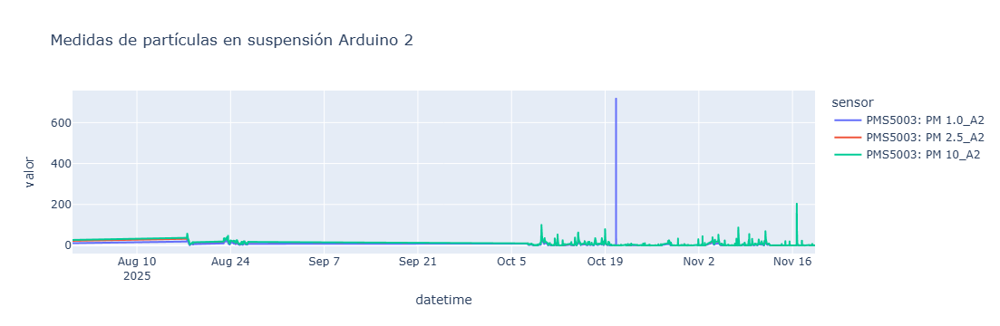

In [9]:
# Representación gráfica de la variable PM del PMS5003 del Arduino 2
S_PMS5003 = df_a2[['datetime', 'PMS5003: PM 1.0_A2', 'PMS5003: PM 2.5_A2','PMS5003: PM 10_A2']]
df_plot = S_PMS5003.melt(id_vars='datetime', var_name='sensor', value_name='valor')

fig = px.line(df_plot, x='datetime', y='valor', color='sensor', title='Medidas de partículas en suspensión Arduino 2')
fig.show()

Se observa el máximo del sensor de partículas de diámetro 1.0 como un posible outlier, ya que no coincide con valores máximos de PM2.5 o PM10.
El máximo del sensor de partículas de diámetro 10 se produce el día 16 de noviembre aproximadamente a las 15 horas. El máximo de partículas PM2.5 no se puede observar en la figura, por lo que, para ver el día y la hora, se representa en una gráfica individual

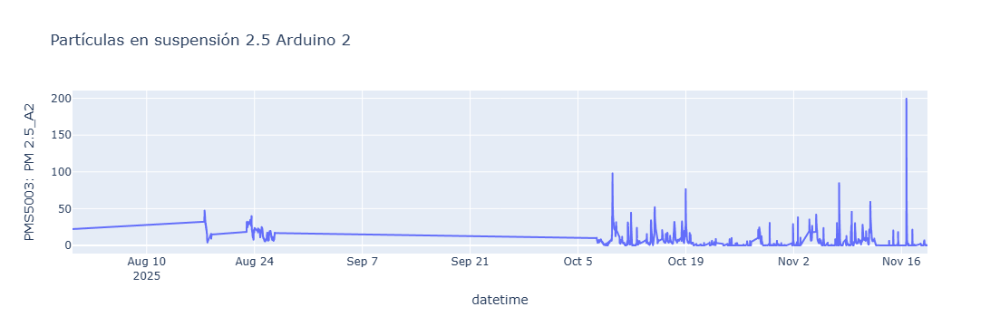

In [10]:
# Representación gráfica de partículas en suspensión de diámetro 2.5 del Arduino 2
S_ppm = df_a2[['datetime','PMS5003: PM 2.5_A2']]

fig = px.line(S_ppm , x='datetime', y='PMS5003: PM 2.5_A2', title='Partículas en suspensión 2.5 Arduino 2')
fig.show()

El máximo se produce el 16 de noviembre entorno a las 15 horas, es decir, el mismo día y a la misma hora que el máximo de partículas de diámetro 10, lo cual indica consistencia en la medición del sensor y podrían ser un outlier legítimo causado por una fuente puntual.

Para evitar ruido en el modelo, se van a eliminar registros donde PM1.0 > PM2.5 o PM2.5 > PM10, ya que violan la lógica física


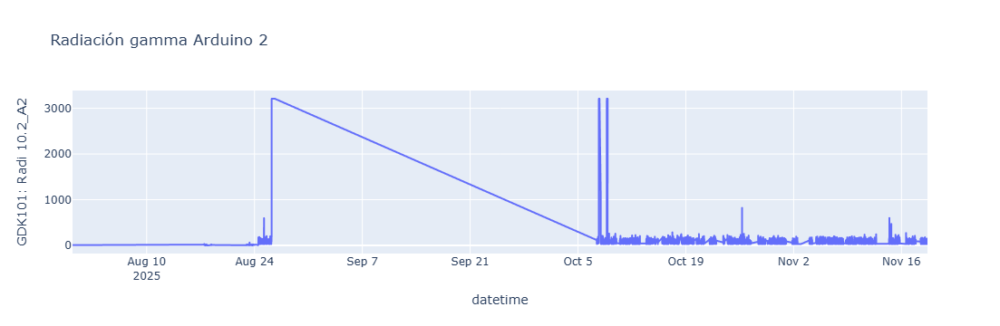

In [11]:
# Representación gráfica de la radación gamma del Arduino 2
S_gamma = df_a2[['datetime','GDK101: Radi 10.2_A2']]

fig = px.line(S_gamma , x='datetime', y='GDK101: Radi 10.2_A2', title='Radiación gamma Arduino 2')
fig.show()

Se observa que estos valores de 3210 nSv/h son muy probablemente debidos a errores en el sensor GDK101.

**Analizar outliers del Arduino**

*   Analizar los mínimos de Humedad relativa y Temperatura del sensor SCD30 que tienen valor 0



In [12]:
# Verificar si los ceros ocurren simultáneamente en temperatura y humedad en A2
ceros_simultaneos_a2 = (
    (df_a2['SCD30: Temp._A2'] == 0) &
    (df_a2['SCD30: Humedad r._A2'] == 0)
)

print(f"Ceros simultáneos en las 2 variables: {ceros_simultaneos_a2.sum()}")

Ceros simultáneos en las 2 variables: 68


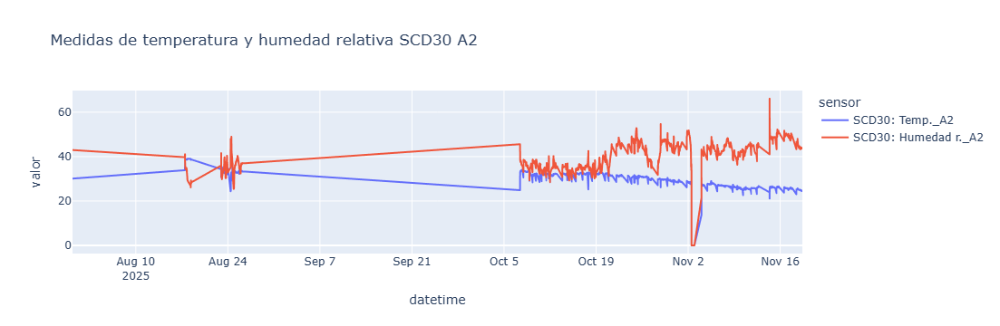

In [13]:
# Representación gráfica de temperatura y humedad relativa en el sensor SCD30
S_temp_hr = df_a2[['datetime', 'SCD30: Temp._A2', 'SCD30: Humedad r._A2']]
df_plot = S_temp_hr.melt(id_vars='datetime', var_name='sensor', value_name='valor')

fig = px.line(df_plot, x='datetime', y='valor', color='sensor', title='Medidas de temperatura y humedad relativa SCD30 A2')
fig.show()

Tanto la temperatura como la humedad relativa tienen mínimos de 0 en el sensor SCD30 que coinciden en el tiempo, lo que indica un error del sensor SCD30

**Eliminar outliers del Arduino**


*   Valores de radiación gamma del sensor GDK101 que parecen errores por tener valores imposibles
*   Valores 0 simultáneos de Temperatura y Humedad relativa
*   Aplicar la regla PM1.0 > PM2.5 o PM2.5 > PM10, ya que violan la lógica física


In [14]:
# Eliminar radiación gamma con valores imposibles (>500 parece error)
df_a2.loc[df_a2['GDK101: Radi 10.2_A2'] > 500, 'GDK101: Radi 10.2_A2'] = np.nan

# Eliminar filas en las que coinciden valores de temperatura, humedad y CO2 a 0 en A2
cols_scd30_a2 = ['SCD30: Temp._A2', 'SCD30: Humedad r._A2', 'SCD30: CO2_A2']
ceros_a2 = (df_a2[cols_scd30_a2] == 0).any(axis=1)
df_a2.loc[ceros_a2, cols_scd30_a2] = np.nan
ceros_a2 = (df_a2[cols_scd30_a2] == 0).any(axis=1)
df_a2.loc[ceros_a2, cols_scd30_a2] = np.nan

# Aplicar la regla PM1.0 ≤ PM2.5 ≤ PM10
# Definir condición de registros INVÁLIDOS (violan la regla)
invalidos_a2 = (df_a2['PMS5003: PM 1.0_A2'] > df_a2['PMS5003: PM 2.5_A2']) | \
               (df_a2['PMS5003: PM 2.5_A2'] > df_a2['PMS5003: PM 10_A2'])

# Marcar como NaN las columnas de PM
df_a2.loc[invalidos_a2, ['PMS5003: PM 1.0_A2', 'PMS5003: PM 2.5_A2', 'PMS5003: PM 10_A2']] = np.nan


In [15]:
# Ordenar los datos de los Arduinos por fecha
df_a2 = df_a2.sort_values('datetime').reset_index(drop=True)


In [16]:
# Antes del resample, comprobar frecuencia original
print("Intervalo entre mediciones A2:")
print(df_a2['datetime'].diff().describe())


Intervalo entre mediciones A2:
count                         5208
mean     0 days 00:30:41.432987711
std      0 days 15:07:33.864383239
min                0 days 00:01:58
25%                0 days 00:09:23
50%                0 days 00:09:28
75%                0 days 00:09:36
max               41 days 19:09:46
Name: datetime, dtype: object


Se va a hacer un remuestreo del dataset a una frecuencia de 10 minutos, ya que es la frecuencia a la que parece que están la mayoría de los datos

In [17]:
def preparar_dataset_aruino(df_a2):
    """
    Función para eliminar el sufijo de las columnas de los datos del Arduino.
    También se aplica un resample de 10 minutos.
    """
    def normalizar_columnas(df, sufijo):
        '''
        Función para eliminar los sufijos.
        '''
        df = df.copy()
        nuevas_cols = {}
        for col in df.columns:
            if col == 'datetime':
                nuevas_cols[col] = col
            else:
                # Quitar el sufijo _A2
                nuevo_nombre = col.replace(f'_{sufijo}', '')
                nuevas_cols[col] = nuevo_nombre
        return df.rename(columns=nuevas_cols)

    # Normalizar nombres de columnas
    df_a2_norm = normalizar_columnas(df_a2, 'A2')

    # Resample a 10 min
    resultado = df_a2_norm.set_index('datetime').resample('10min').mean()

    # Eliminar filas completamente vacías
    resultado = resultado.dropna(how='all')

    return resultado

# Preparar el dataset final del arduino A2
df_arduino_final = preparar_dataset_aruino(df_a2)

print(f"Registros totales: {len(df_arduino_final)}")
print(f"\nOrigen de datos:")
print(f"\nColumnas: {df_arduino_final.columns.tolist()}")

Registros totales: 4683

Origen de datos:

Columnas: ['PMS5003: PM 1.0', 'PMS5003: PM 2.5', 'PMS5003: PM 10', 'DHT22: Temp.', 'DHT22: Humedad r.', 'MQ-7: CO', 'SHT85: Temp.', 'SHT85: Humedad r.', 'GDK101: Radi 10.2', 'SCD30: Temp.', 'SCD30: Humedad r.', 'SCD30: CO2']


In [18]:
df_arduino_final.head()

,PMS5003: PM 1.0,PMS5003: PM 2.5,PMS5003: PM 10,DHT22: Temp.,DHT22: Humedad r.,MQ-7: CO,SHT85: Temp.,SHT85: Humedad r.,GDK101: Radi 10.2,SCD30: Temp.,SCD30: Humedad r.,SCD30: CO2
datetime,,,,,,,,,,,,
2025-07-31 08:50:00,10.90,22.20,26.70,31.570,57.640,6.940,29.390,42.330,6.670,30.090,42.960,271.380
2025-08-17 11:20:00,18.90,32.20,37.10,33.130,46.050,2.580,33.360,40.610,16.440,33.870,39.720,388.320
2025-08-17 11:30:00,20.98,35.16,39.78,33.634,43.376,0.888,35.864,40.452,15.956,35.618,40.560,376.300
2025-08-17 11:40:00,21.98,36.06,41.78,34.626,42.064,0.798,37.864,37.518,11.530,37.030,38.680,368.048
2025-08-17 11:50:00,23.18,35.58,40.68,35.248,41.332,0.800,38.826,36.252,9.224,37.896,37.412,362.234


Ver cuántos valores perdidos quedan en el dataset final del Arduino

In [19]:
print(df_arduino_final.isna().sum())

PMS5003: PM 1.0       1
PMS5003: PM 2.5       1
PMS5003: PM 10        1
DHT22: Temp.          0
DHT22: Humedad r.     0
MQ-7: CO              0
SHT85: Temp.          0
SHT85: Humedad r.     0
GDK101: Radi 10.2    97
SCD30: Temp.         64
SCD30: Humedad r.    64
SCD30: CO2           64
dtype: int64


No son muchos datos, por lo que se van a dejar de momento. Cuando se una con el dataset de variables meteorológicas y la tarjet, se tomará una decisión.

**Matriz de correlación de las variables de los Arduinos**

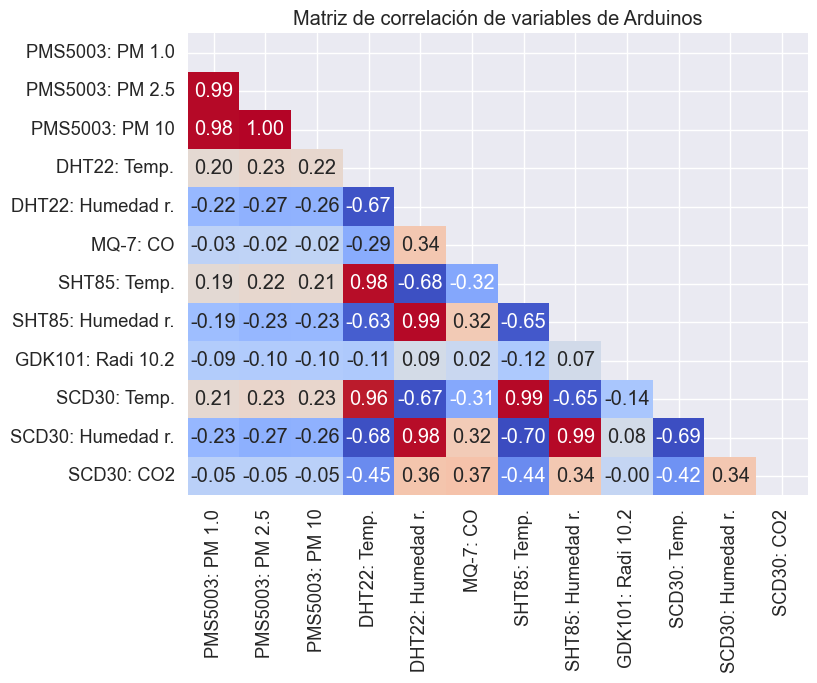

In [20]:
correlation_matrix = df_arduino_final.corr(numeric_only=True)

# Crear una máscara para ocultar la mitad superior de la matriz (simetría)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
plt.figure(figsize=(8, 6))
sns.set(font_scale=1.2)

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar=False, mask=mask)

plt.title("Matriz de correlación de variables de Arduinos")
plt.show()


Las variables de Temperatura y Humedad relativa de los sensores tienen una correlación muy alta, lo cual es lógico.
Se van a eliminar las de los sensores SCD30, por ser el que mayor número de valores perdidos tiene, y parece que está mal calibrado o tiene errores, y las del sensor DHT22, ya que el SHT85 es mejor sensor.
Las variables correspondientes a los diámetros de partículas también están muy correlacionadas, por lo que se decide utilizar solo el diámetro de referencia 2.5

In [21]:
# Eliminar las columnas que no se van a utilizar en el modelo
cols_drop = [
    'PMS5003: PM 1.0',
    'PMS5003: PM 10',
    'DHT22: Temp.',
    'DHT22: Humedad r.',
    'SCD30: Temp.',
    'SCD30: Humedad r.'
]

df_arduino_clean = df_arduino_final.drop(columns=cols_drop, axis=1)


In [22]:
df_arduino_clean.head()

,PMS5003: PM 2.5,MQ-7: CO,SHT85: Temp.,SHT85: Humedad r.,GDK101: Radi 10.2,SCD30: CO2
datetime,,,,,,
2025-07-31 08:50:00,22.20,6.940,29.390,42.330,6.670,271.380
2025-08-17 11:20:00,32.20,2.580,33.360,40.610,16.440,388.320
2025-08-17 11:30:00,35.16,0.888,35.864,40.452,15.956,376.300
2025-08-17 11:40:00,36.06,0.798,37.864,37.518,11.530,368.048
2025-08-17 11:50:00,35.58,0.800,38.826,36.252,9.224,362.234


In [23]:
df_arduino_clean.shape

(4683, 6)

# **Carga y limpieza de los datos del sensor de radón Airthings**

**Función para cargar los datos del fichero airthings**

In [24]:
def cargar_airthings(filepath):
    '''
    Función para cargar los datos del fichero airthings.csv.
    Añade el sufijo _airthings a las columnas de los datos del sensor.
    Devuelve el dataframe con los datos del sensor.
    '''
    df = pd.read_csv(
        filepath,
        sep=';',
        header=None,
        dtype=str,
        encoding='utf-8',
        on_bad_lines='skip'
    )

    # La primera fila es la cabecera
    column_names = df.iloc[0].tolist()

    # Convertir la columna de la fecha
    df['datetime'] = pd.to_datetime(df[0], format='%Y-%m-%d %H:%M:%S', errors='coerce')

    # Quedarse solo con las filas que tienen fecha válida
    df_clean = df[df['datetime'].notna()].copy()

    # Asignar nombres de columnas
    df_clean.columns = column_names + ['datetime']

    # Convertir tipos numéricos
    numeric_cols = list(df_clean.columns.values)
    numeric_cols.remove('datetime')
    for col in numeric_cols:
        df_clean[col] = pd.to_numeric(df_clean[col], errors='coerce')

    df_clean = df_clean.drop(columns=['fechayhora'])

    # Renombrar columnas para claridad en análisis posterior
    rename_dict = {col: f"{col}_airthings" for col in numeric_cols}
    df_clean = df_clean.rename(columns=rename_dict)

    # Quedarse con el primer registro de cada timestamp repetido
    df_clean = df_clean.drop_duplicates(subset='datetime', keep='first')

    return df_clean


In [25]:
# Cargar datos de radón
ruta_base = 'https://raw.githubusercontent.com/MariaExtrella/TFM/refs/heads/main/airthings.csv'
df_radon = cargar_airthings(ruta_base)
df_radon.head()

,radon_airthings,temperatura_airthings,humedadr_airthings,presion_airthings,co2_airthings,voc_airthings,datetime
1,159.0,27.1,53.0,955.0,646.0,146.0,2025-08-13 10:23:36
3,159.0,27.1,53.0,954.0,633.0,163.0,2025-08-13 10:24:22
5,159.0,27.1,53.0,954.0,633.0,163.0,2025-08-13 10:28:37
7,159.0,27.1,53.0,954.0,630.0,163.0,2025-08-13 10:31:11
8,159.0,27.1,53.0,954.0,630.0,163.0,2025-08-13 10:36:31


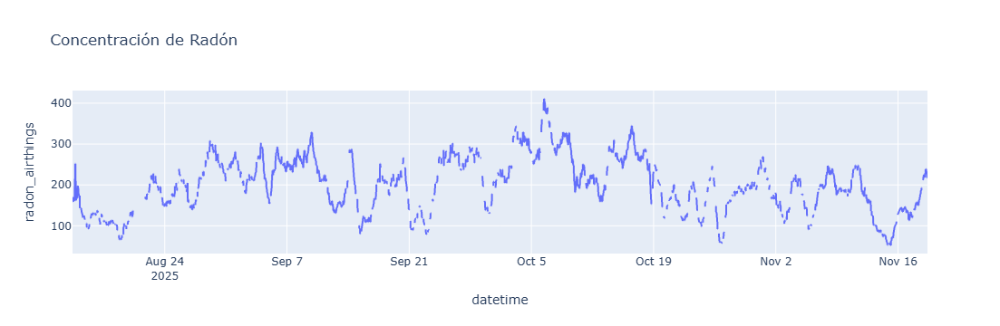

In [26]:
# Representación gráfica de la concentración de radón del Airthings
S_radon = df_radon[['datetime','radon_airthings']]

fig = px.line(S_radon , x='datetime', y='radon_airthings', title='Concentración de Radón')
fig.show()

Se necesita ver cómo es el ciclo en un día, para ver si la hora influye en los niveles de concentración de radón

<Axes: xlabel='hora'>

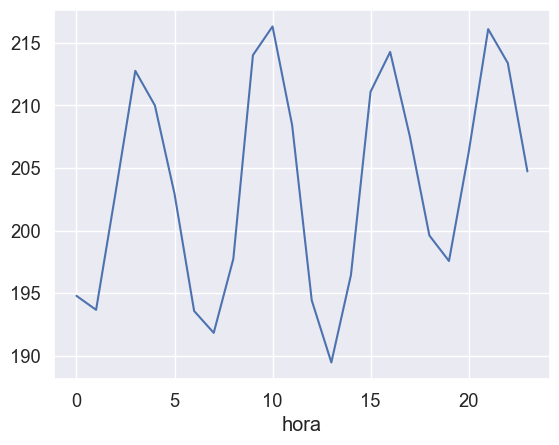

In [27]:
# Representación por hora de la media de concentración de radón en el perdiodo de un día
df_radon_hora = df_radon.copy()
df_radon_hora['hora'] = df_radon['datetime'].dt.hour
df_radon_hora.groupby('hora')['radon_airthings'].mean().plot()

El gráfico no muestra el patrón típico día/noche que se esperaba, si no que hay varios picos más durante el día.
Para entender esta gráfica, hay que tener en cuenta que el sensor se encuentra ubicado en un garaje, en una región geográfica calurosa y seca, con terreno granítico. En una habitación normal, al abrir la ventana el aire tarda en renovarse entre 30 y 60 minutos, sin embargo, en un garaje, cambia todo el volumen de aire en segundos al abrir el portón para entrar o salir los vehículos.
La interpretación que se puede hacer de los picos y valles coincide con la entrada/salida de los vehículos durante las horas de ida y vuelta al trabajo y las horas en las que la actividad disminuye (noche y horario escolar y laboral).

Comprobar si el ciclo se mantiene a lo largo de la semana o depende del uso del garaje en el que está ubicado el sensor.

<Axes: xlabel='hora'>

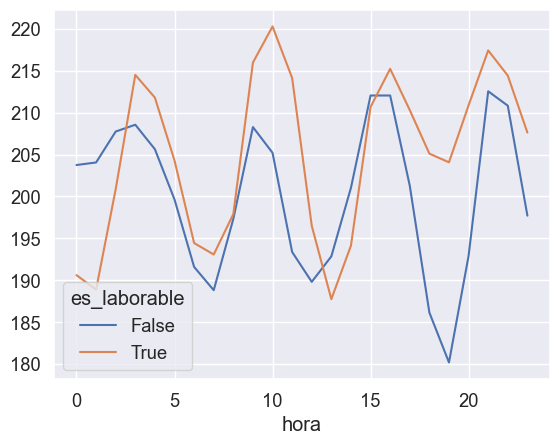

In [28]:
df_radon_hora['es_laborable'] = df_radon_hora['datetime'].dt.dayofweek < 5
df_radon_hora.groupby(['es_laborable', 'hora'])['radon_airthings'].mean().unstack(0).plot()

El patrón se mantiene, aunque con diferencias de amplitud. Esto sugiere que, además del uso del garaje, existen factores físicos subyacentes (el ritmo diario de calentamiento/enfriamiento del edificio provocado por el sol, diferencia de presión atmosférica, etc.) que modulan la concentración de radón independientemente de la actividad humana, lo que refuerza la importancia de incluir tanto variables temporales como ambientales

**Análisis de estadísticos descriptivos del dataset del Airthings**

In [29]:
# Seleccionar las columnas numéricas en el DataFrame
numericas_air = df_radon.select_dtypes(include=['int', 'int32', 'int64','float', 'float32', 'float64'])

# Descriptivos de los datos del Airthings
descriptivos_airthings = numericas_air.describe().T.round(2)
descriptivos_airthings

,count,mean,std,min,25%,50%,75%,max
radon_airthings,18610.0,203.72,66.51,52.0,153.0,204.0,254.0,411.0
temperatura_airthings,18610.0,24.32,2.10,19.3,23.5,24.8,25.8,28.4
humedadr_airthings,18610.0,58.59,7.79,30.0,53.0,57.0,65.0,78.0
presion_airthings,18610.0,955.97,3.44,941.0,954.0,956.0,959.0,964.0
co2_airthings,18610.0,576.30,88.42,350.0,511.0,565.0,627.0,1060.0
voc_airthings,18610.0,112.25,74.63,46.0,67.0,93.0,133.0,2272.0


Los datos del sensor de referencia son muy buenos para entrenar un modelo, ya que hay medidas desde 52 Bq/m³ hasta 411 Bq/m³, lo cual es un amplio rango y el modelo tendrá ejemplos de "radón bajo" y "radón alto(peligroso)".
La media está entorno a los 204 Bq/m³, un nivel considerablemente alto, por lo que es un escenario real de riesgo, lo que hace muy importantes las predicciones del modelo.
El máximo de C02 y la media tan alta pueden deberse a que el sensor está en un garaje y ser debidos al arranque de los coches.


**Matriz de correlación entre la concentración de radón y el resto de variables medidas por el sensor**

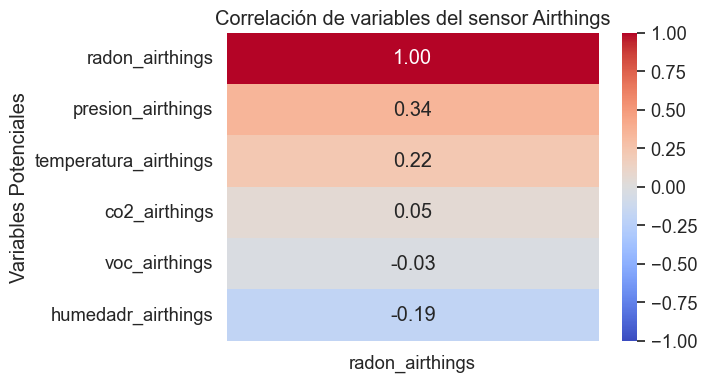

In [30]:
# Seleccionar solo las columnas numéricas
correlation_matrix = df_radon.corr(numeric_only=True)

plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix[['radon_airthings']].sort_values(by='radon_airthings', ascending=False),
            annot=True,
            cmap='coolwarm',
            vmin=-1, vmax=1,
            fmt='.2f')
plt.title('Correlación de variables del sensor Airthings')
plt.ylabel('Variables Potenciales')
plt.show()


La matriz de correlación revela que la dinámica del radón en este garaje está gobernada principalmente por factores meteorológicos, no por la actividad humana:
1.   Dependencia de la Presión: La correlación es positiva, lo que sugiere que los periodos de estabilidad anticiclónica favorecen la acumulación de radón, mientras que las bajas presiones hacen que disminuya.
2.   Validación del "Efecto Chimenea" de los edificios: La correlación positiva entre temperatura y radón confirma que el calentamiento del recinto (propio de la ubicación en zona cálida) actúa como mecanismo que impulsa el radón desde el subsuelo.
3.   Desacople del CO2: La baja correlación lineal con el CO2 podría ser atribuida a la naturaleza del recinto (garaje), donde las emisiones son puntualmente producidas por los vehículos, lo que distorsiona la relación entre ocupación (más C02 debido a la respiración de los ocupantes) y ventilación que hay en las viviendas.



Ver si el radón no responde a factores puntuales, si no acumulativos, como ya se sabe que ocurre

In [31]:
# Correlación con retardos (el radón responde a cambios pasados)
for lag in [1, 3, 6, 12, 18, 24, 36, 48, 60]:  # en intervalos de 10 min
    corr_presion = df_radon['radon_airthings'].corr(df_radon['presion_airthings'].shift(lag))
    print(f"Correlación radón vs presión (lag {lag*10} min): {corr_presion:.3f}")
for lag in [1, 3, 6, 12, 18, 24, 36, 48, 60]:  # en intervalos de 10 min
    corr_temp = df_radon['radon_airthings'].corr(df_radon['temperatura_airthings'].shift(lag))
    print(f"Correlación radón vs temperatura (lag {lag*10} min): {corr_temp:.3f}")
for lag in [1, 3, 6, 12, 18, 24, 36, 48, 60]:  # en intervalos de 10 min
    corr_hr = df_radon['radon_airthings'].corr(df_radon['humedadr_airthings'].shift(lag))
    print(f"Correlación radón vs humedad relativa (lag {lag*10} min): {corr_hr:.3f}")

Correlación radón vs presión (lag 10 min): 0.346
Correlación radón vs presión (lag 30 min): 0.351
Correlación radón vs presión (lag 60 min): 0.358
Correlación radón vs presión (lag 120 min): 0.374
Correlación radón vs presión (lag 180 min): 0.395
Correlación radón vs presión (lag 240 min): 0.422
Correlación radón vs presión (lag 360 min): 0.502
Correlación radón vs presión (lag 480 min): 0.424
Correlación radón vs presión (lag 600 min): 0.372
Correlación radón vs temperatura (lag 10 min): 0.224
Correlación radón vs temperatura (lag 30 min): 0.230
Correlación radón vs temperatura (lag 60 min): 0.241
Correlación radón vs temperatura (lag 120 min): 0.266
Correlación radón vs temperatura (lag 180 min): 0.296
Correlación radón vs temperatura (lag 240 min): 0.335
Correlación radón vs temperatura (lag 360 min): 0.452
Correlación radón vs temperatura (lag 480 min): 0.339
Correlación radón vs temperatura (lag 600 min): 0.264
Correlación radón vs humedad relativa (lag 10 min): -0.197
Correlación

El análisis de correlaciones con retardo temporal revela que las variables  ambientales alcanzan su máxima asociación con la concentración de radón a un desfase de 6 horas: presión (r=0.502), temperatura (r=0.452) y humedad relativa (r=-0.388). Este retardo común sugiere un tiempo característico de respuesta del sistema suelo-garaje a las variaciones meteorológicas y justifica la inclusión de variables retardadas como predictores en el modelo.

In [32]:
# Resample del dataframe de radón a 10 minutos, al igual que en el Arduino
df_radon_r = df_radon.set_index('datetime').resample('10min').mean()

# Ordenar los datos por fecha
df_radon_r = df_radon_r.sort_index()
df_radon_r.head()

,radon_airthings,temperatura_airthings,humedadr_airthings,presion_airthings,co2_airthings,voc_airthings
datetime,,,,,,
2025-08-13 10:20:00,159.0,27.1,53.0,954.333333,637.333333,157.333333
2025-08-13 10:30:00,159.0,27.1,53.0,954.000000,630.000000,163.000000
2025-08-13 10:40:00,159.0,27.1,53.0,954.000000,638.000000,160.000000
2025-08-13 10:50:00,159.0,27.1,53.0,954.000000,641.000000,157.000000
2025-08-13 11:00:00,159.0,27.1,53.0,954.000000,640.000000,166.000000


In [33]:
df_radon_r.shape

(14104, 6)

# **Carga y limpieza de los datos de la estación meteorológica**

In [34]:
def cargar_wunder(filepath):
    '''
    Función para cargar los datos del fichero wunder.csv.
    Añade el sufijo _meteo a las columnas de los datos del sensor.
    Elimina las colunnas 'Direccion' y 'Elevacion' porque tiene un valor constante,
    ya que solo se tiene una estación meteorológica.
    Devuelve el dataframe con los datos del sensor.
    '''
    df = pd.read_csv(
        filepath,
        sep=';',
        header=None,
        dtype=str,
        encoding='utf-8',
        on_bad_lines='skip'
    )

        # La primera fila es la cabecera
    column_names = df.iloc[0].tolist()

    # Convertir a datetime (formato ISO, no europeo)
    df['datetime'] = pd.to_datetime(df[0], format='%Y-%m-%d %H:%M:%S', errors='coerce')

    # Quedarse solo con las filas que tienen fecha válida
    df_clean = df[df['datetime'].notna()].copy()

    # Eliminar columna 0 y asignar nombres
    df_clean = df_clean.drop(columns=[0])
    df_clean.columns = column_names[1:] + ['datetime']

    # Obtener nombre de las columnas numéricas
    numeric_cols = list(df_clean.columns.values)
    numeric_cols.remove('datetime')

    # Convertir tipos numéricos
    for col in numeric_cols:
        if col in df_clean.columns:
            df_clean[col] = pd.to_numeric(df_clean[col], errors='coerce')

    df_clean = df_clean.drop(columns=['Direccion'])

    # Renombrar con sufijo _meteo
    rename_dict = {col: f"{col}_meteo" for col in df_clean.columns if col != 'datetime'}
    df_clean = df_clean.rename(columns=rename_dict)

    # Quedarse con el primer registro de cada timestamp
    df_clean = df_clean.drop_duplicates(subset='datetime', keep='first')

    return df_clean

In [35]:
ruta_base = 'https://raw.githubusercontent.com/MariaExtrella/TFM/refs/heads/main/wunder.csv'
df_meteo = cargar_wunder(ruta_base)
df_meteo.head()

,Temperatura_meteo,Indice de Calor_meteo,Punto de Rocio_meteo,Sensación Termica_meteo,Velocidad del Viento_meteo,Rafaga de Viento_meteo,Presion_meteo,Tasa de Precipitacion_meteo,Total de Precipitacion_meteo,Elevacion_meteo,Humedad_meteo,datetime
1,39.6,38.3,10.9,39.6,0.4,1.8,1013.99,0.0,0.0,160.9,18,2025-08-13 14:16:05
2,39.6,38.3,10.9,39.6,0.0,0.0,1013.99,0.0,0.0,160.9,18,2025-08-13 14:16:22
3,39.7,38.4,11.0,39.7,0.4,1.8,1013.72,0.0,0.0,160.9,18,2025-08-13 14:16:39
4,40.3,38.6,9.7,40.3,4.0,7.2,1013.88,0.0,0.0,160.9,16,2025-08-13 14:20:55
6,39.3,37.8,10.7,39.3,1.1,1.8,1013.72,0.0,0.0,160.9,18,2025-08-13 14:31:33


**Calcular los estadísticos descriptivos del dataset de las variables meteorológicas**

In [36]:
# Seleccionar las columnas numéricas en el DataFrame
numericas_meteo = df_meteo.select_dtypes(include=['int', 'int32', 'int64','float', 'float32', 'float64'])

# Descriptivos de los datos de ña estación meteorológica
descriptivos_meteo = numericas_meteo.describe().T.round(2)
descriptivos_meteo

,count,mean,std,min,25%,50%,75%,max
Temperatura_meteo,26791.0,20.96,6.92,4.30,16.00,19.90,25.60,43.70
Indice de Calor_meteo,26791.0,20.63,6.48,4.30,16.00,19.90,25.20,41.90
Punto de Rocio_meteo,26791.0,10.31,3.68,-2.40,8.40,10.70,12.80,18.30
Sensación Termica_meteo,26791.0,20.96,6.92,4.30,16.00,19.90,25.60,43.70
Velocidad del Viento_meteo,26791.0,1.56,2.07,0.00,0.00,0.70,2.50,16.20
Rafaga de Viento_meteo,26791.0,2.47,3.04,0.00,0.00,1.80,3.60,31.30
Presion_meteo,26791.0,1015.99,3.32,1001.08,1014.19,1016.19,1018.49,1023.50
Tasa de Precipitacion_meteo,26791.0,0.06,0.65,0.00,0.00,0.00,0.00,28.80
Total de Precipitacion_meteo,26791.0,0.47,1.90,0.00,0.00,0.00,0.00,21.79
Elevacion_meteo,26791.0,160.90,0.00,160.90,160.90,160.90,160.90,160.90


Las variables Temperatura e Índice de calor tienen valores muy parecidos, al igual que ocurre con la variable Sensación Térmica, por tanto, estas dos últimas variables no entrarán en el modelo, ya que además son derivadas de la Temperatura y la Humedad. Podría pensarse que en un lugar con más humedad que en Extremadura, estos valores no serían iguales, pero al ser derivadas de las que sí entrarán, las predicciones servirán para cualquier tipo de clima.

Entre las variables Ráfaga de viento y Velocidad del viento tampoco hay mucha diferencia. Además, la variable Ráfaga de viento mide la velocidad del viento instantáneo máximo en un momento determinado, por lo que puede no ser de mucha utilidad.

Igualmente ocurre con la Tasa de precipitación y el Total de precipitación, ya que la primera mide la intensidad de la lluvia en ese momento exacto, mientras que el total mide la cantidad de agua acumulada durante un periodo. Lo que le interesa al modelo es si el suelo está mojado o no, no la intensidad de la lluvia.
A partir de los datos del mínimo y los percentiles, se ve que habrá muchas filas en las que la variable Total de precipitación sea 0, ya que los meses en los que se han tomado las muestras han sido meses muy secos. Se entrenará el modelo utilizando esta variable como numérica, pero habría que plantear si convertirla en una variable binaria de la forma Suelo_mojado (Verdadero/Falso).

La variable Elevación tiene un único valor porque solo hay una estación meteorológica, por lo que se va a eliminar y no entrará en el modelo.


In [37]:
# Resample del dataframe de la estación meteorológica a 10 minutos, como los otros dos
df_meteo_r = df_meteo.set_index('datetime').resample('10min').mean()

# Ordenar los datos por fecha
df_meteo_r = df_meteo_r.sort_index()
df_meteo_r.shape

(14081, 11)

**Comprobar si la correlación entre el interior y el exterior afecta a la concentración de radón para justificar la inclusión de las variables exteriores en el modelo**

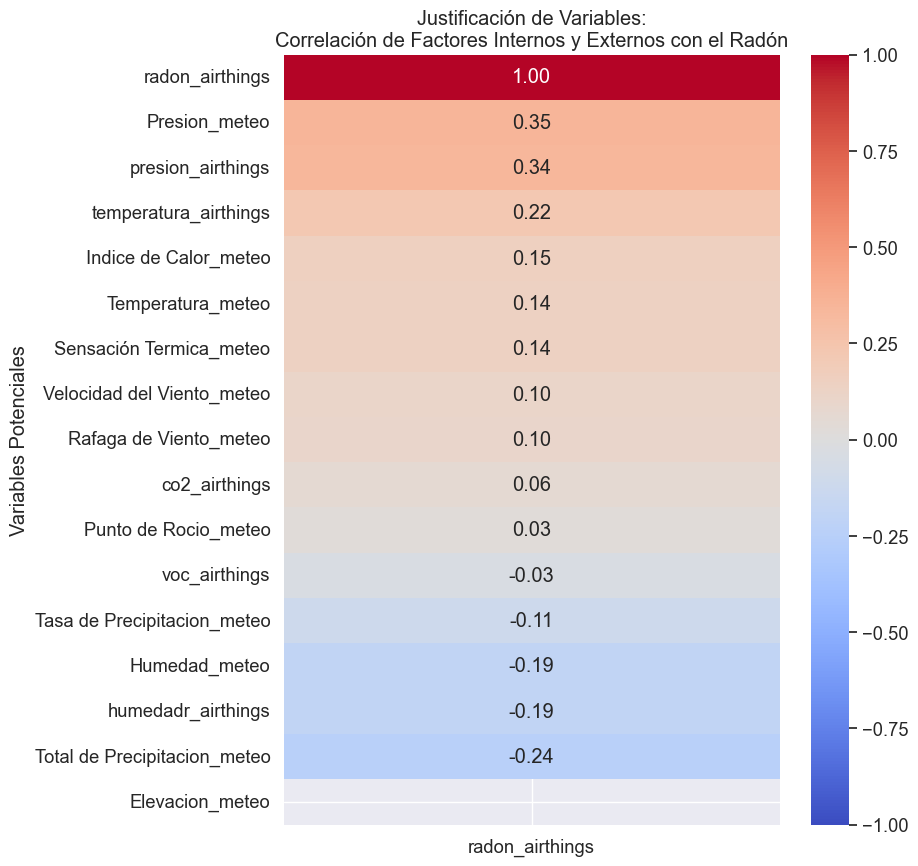

In [38]:
# Unir los dataset del Airthings y la estación meteorológica en uno solo
df_justificacion = df_radon_r.join(df_meteo_r, how='inner')

# Calcular correlación
matriz_corr = df_justificacion.corr(numeric_only=True)

# Visualizar solo la columna del Radón
plt.figure(figsize=(8, 10))
sns.heatmap(matriz_corr[['radon_airthings']].sort_values(by='radon_airthings', ascending=False),
            annot=True,
            cmap='coolwarm',
            vmin=-1, vmax=1,
            fmt='.2f')

plt.title('Justificación de Variables:\nCorrelación de Factores Internos y Externos con el Radón')
plt.ylabel('Variables Potenciales')
plt.show()


La presión (tanto interior como exterior) y la temperatura (interior y exterior) son las variables que más influyen en la concentración de radón, por lo que vamos a utilizarlas como variables de entrada en los modelos.
En el caso de la variable presión, solo se puede utilizar la variable externa (presion_meteo), ya que los sensores de los Arduinos no miden la presión interna.
Para la temperatura, se utilizarán tanto la variable correspondiente a la estación meteorológica (temperatura exterior) como la temperatura medida por los sensores de los Arduinos.

Las variables precipitación y humedad tienen una correlación negativa y tienen que entrar al modelo.

Las variables Ráfaga de viento y Velocidad del viento, como ya se ha supuesto, al tener los valores similares, tienen la misma correlación.

En cuanto a las variables Tasa de precipitación y Total de precipitación, como se ha comentado anteriormente, es más importante esta última que la Tasa, hecho que se puede ver también en la matriz de correlación.


In [39]:
# Eliminar las variables de la estación meteorológica que no se van a utilizar en el modelo
df_meteo_final = df_meteo_r.copy()
df_meteo_final = df_meteo_final.drop(columns=['Sensación Termica_meteo', 'Indice de Calor_meteo', 'Rafaga de Viento_meteo', 'Tasa de Precipitacion_meteo', 'Elevacion_meteo'], axis=1)
df_meteo_final.head()

,Temperatura_meteo,Punto de Rocio_meteo,Velocidad del Viento_meteo,Presion_meteo,Total de Precipitacion_meteo,Humedad_meteo
datetime,,,,,,
2025-08-13 14:10:00,39.633333,10.933333,0.266667,1013.900000,0.0,18.000000
2025-08-13 14:20:00,40.300000,9.700000,4.000000,1013.880000,0.0,16.000000
2025-08-13 14:30:00,39.550000,10.450000,0.550000,1013.800000,0.0,17.500000
2025-08-13 14:40:00,39.866667,10.833333,2.900000,1013.683333,0.0,17.666667
2025-08-13 14:50:00,39.900000,10.300000,3.050000,1013.770000,0.0,17.000000


**Unir los datasets para la entrada al modelo**

Las variables predictoras serán las del Arduino y la Estación meteorológica. Del dataset del Airthings, solo entrará la concentración de radón como variable target.
A la hora de interpolar los valores perdidos, solo se hará para las variables predictoras, no para la target, ya que se estaría evaluando con valores de radón inventados. Tampoco se van a interpolar todos los valores perdidos consecutivos, solo los que estén en un un intervalo máximo de 30 minutos (3 x 10min)

In [40]:
# Unir datasets
df_merge = pd.merge(
    left=df_arduino_clean,
    right=df_radon_r['radon_airthings'],
    left_index=True,
    right_index=True,
    how='inner'
)
print(f"Registros tras unir con Airthings: {len(df_merge)}")

df_final_nuevo = pd.merge(
    left=df_merge,
    right=df_meteo_final,
    left_index=True,
    right_index=True,
    how='left'
)
print(f"Registros tras unir con estación meteorológica: {len(df_final_nuevo)}")

# Interpolar SOLO las variables predictoras (no el radón)
columnas_features = [col for col in df_final_nuevo.columns if col != 'radon_airthings']
df_final_nuevo[columnas_features] = df_final_nuevo[columnas_features].interpolate(method='time', limit=3)

# Eliminar filas donde el radón sea NaN (no inventar valores del target)
df_final_nuevo = df_final_nuevo.dropna(subset=['radon_airthings'])

# Eliminar filas donde las variables aún tengan NaN
df_final_nuevo = df_final_nuevo.dropna()

print(f"Registros finales: {len(df_final_nuevo)}")
print(f"Rango: {df_final_nuevo.index.min()} a {df_final_nuevo.index.max()}")


Registros tras unir con Airthings: 4682
Registros tras unir con estación meteorológica: 4682
Registros finales: 3236
Rango: 2025-08-17 11:30:00 a 2025-11-19 08:50:00


**Matriz de correlación de todas las variables**

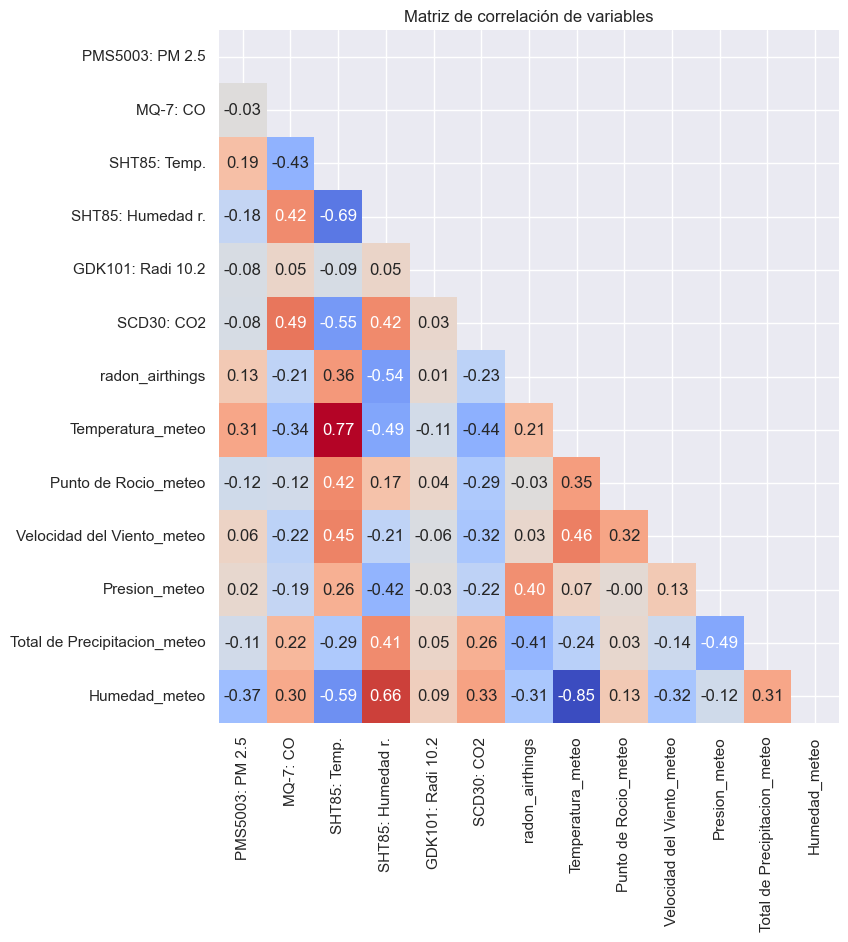

In [41]:
correlation_matrix = df_final_nuevo.corr(numeric_only=True)

# Crear una máscara para ocultar la mitad superior de la matriz (simetría)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
plt.figure(figsize=(8, 9))
sns.set(font_scale=1)

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar=False, mask=mask)

plt.title("Matriz de correlación de variables")
plt.show()

La variable radiación gamma del sensor GDK101, según la matriz, no tiene mucha importancia. Esto puede ser debido a que el sensor GDK101 es un sensor low-cost y no es capaz de ver las fluctuaciones finas del radón, por lo que habrá que analizarla.

Las variables Velocidad del viento y Punto de Rocío tampoco parecen tener mucha importancia para el radón, pero se van a mantener de momento, ya que tampoco estorban porque no existe multicolinealidad con otras variables y puede que los algoritmos aprendan algún patrón oculto. Tras el entrenamiento, si al ver la importancia de las variables se ve que no tienen mucha, se eliminarán del modelo final.


In [42]:
# Comprobar correlación Radiación gamma vs radón
print(df_final_nuevo[['GDK101: Radi 10.2', 'radon_airthings']].corr())

# Por si hay relación retardada
for lag in [0, 6, 12, 36]:
    corr = df_final_nuevo['GDK101: Radi 10.2'].corr(
        df_final_nuevo['radon_airthings'].shift(lag)  # Radiación gamma actual vs radón PASADO
    )
    print(f"Radiación gamma actual vs radón hace {lag*10}min: {corr:.3f}")

                   GDK101: Radi 10.2  radon_airthings
GDK101: Radi 10.2           1.000000         0.010367
radon_airthings             0.010367         1.000000
Radiación gamma actual vs radón hace 0min: 0.010
Radiación gamma actual vs radón hace 60min: 0.011
Radiación gamma actual vs radón hace 120min: 0.012
Radiación gamma actual vs radón hace 360min: 0.014


La variable Radiación gamma no tiene apenas correlación con el radón, además, esta no varía con el tiempo, lo que lleva a pensar que el sensor GDK101 no está capturando la dinámica del radón, si no una radiación más bien constante, que probablemente esté producida por otro gas. Esto puede atribuirse también a que la desintegración del radón emite principalmente partículas alfa, mientras que el GDK101 detecta radiación gamma. Por tanto, la decisión es no incluir esta variable en el modelo final.

# **Feature Engineering (Enriquecer el dataset con variables con retardo)**

**Analizar el comportamiento del radón con el tiempo**

Al igual que se calculó la correlación con el tiempo de las variables internas medidas por el propio sensor de radón, se calcula la correlación de las variables externas y las variables internas medias por el Arduino, que son las que realmente van a entrar en el modelo.

In [43]:
# Correlación variables externas con retardos (el radón responde a cambios pasados)
for lag in [1, 3, 6, 12, 18, 24, 36, 48, 60]:  # en intervalos de 10 min
    corr_presion = df_final_nuevo['radon_airthings'].corr(df_final_nuevo['Presion_meteo'].shift(lag))
    print(f"Correlación radón vs presión exterior (lag {lag*10} min): {corr_presion:.3f}")
for lag in [1, 3, 6, 12, 18, 24, 36, 48, 60]:  # en intervalos de 10 min
    corr_temp = df_final_nuevo['radon_airthings'].corr(df_final_nuevo['Temperatura_meteo'].shift(lag))
    print(f"Correlación radón vs temperatura exterior (lag {lag*10} min): {corr_temp:.3f}")
for lag in [1, 3, 6, 12, 18, 24, 36, 48, 60]:  # en intervalos de 10 min
    corr_hr = df_final_nuevo['radon_airthings'].corr(df_final_nuevo['Humedad_meteo'].shift(lag))
    print(f"Correlación radón vs humedad relativa exterior (lag {lag*10} min): {corr_hr:.3f}")

Correlación radón vs presión exterior (lag 10 min): 0.404
Correlación radón vs presión exterior (lag 30 min): 0.409
Correlación radón vs presión exterior (lag 60 min): 0.415
Correlación radón vs presión exterior (lag 120 min): 0.426
Correlación radón vs presión exterior (lag 180 min): 0.437
Correlación radón vs presión exterior (lag 240 min): 0.447
Correlación radón vs presión exterior (lag 360 min): 0.460
Correlación radón vs presión exterior (lag 480 min): 0.457
Correlación radón vs presión exterior (lag 600 min): 0.440
Correlación radón vs temperatura exterior (lag 10 min): 0.207
Correlación radón vs temperatura exterior (lag 30 min): 0.208
Correlación radón vs temperatura exterior (lag 60 min): 0.210
Correlación radón vs temperatura exterior (lag 120 min): 0.215
Correlación radón vs temperatura exterior (lag 180 min): 0.220
Correlación radón vs temperatura exterior (lag 240 min): 0.231
Correlación radón vs temperatura exterior (lag 360 min): 0.250
Correlación radón vs temperatura e

La correlación con la Presión exterior sube constantemente hasta alcanzar su máximo (0.440) a las 6 horas. Cuando la presión atmosférica cambia fuera, el aire dentro de los poros profundos de la tierra tarda tiempo en enterarse y reaccionar empujando el radón a través del suelo y de los edificios, por tanto, más importante que la presión actual será la tendencia de esta. Esto provocaría que, ante una caída repentina de presión atmosférica, la presión en el terreno se mantuviese en valores superiores a los del interior, favoreciendo la entrada de radón en la casa.

La correlación con la Temperatura exterior también va creciendo con el tiempo.

Para la Humedad exterior, se observa que la correlación también va creciendo, pero al poco tiempo decae de nuevo.

In [44]:
# Correlación variables internas con retardo
for lag in [1, 3, 6, 12, 18, 24, 36, 48, 60]:  # en intervalos de 10 min
    corr_hrint = df_final_nuevo['radon_airthings'].corr(df_final_nuevo['SHT85: Humedad r.'].shift(lag))
    print(f"Correlación radón vs humedad relativa interior (lag {lag*10} min): {corr_hrint:.3f}")

for lag in [1, 3, 6, 12, 18, 24, 36, 48, 60]:  # en intervalos de 10 min
    corr_tempint = df_final_nuevo['radon_airthings'].corr(df_final_nuevo['SHT85: Temp.'].shift(lag))
    print(f"Correlación radón vs temperatura interior (lag {lag*10} min): {corr_tempint:.3f}")

for lag in [1, 3, 6, 12, 18, 24, 36, 48, 60]:  # en intervalos de 10 min
    corr_co2 = df_final_nuevo['radon_airthings'].corr(df_final_nuevo['SCD30: CO2'].shift(lag))
    print(f"Correlación radón vs CO2 interior (lag {lag*10} min): {corr_co2:.3f}")

Correlación radón vs humedad relativa interior (lag 10 min): -0.544
Correlación radón vs humedad relativa interior (lag 30 min): -0.548
Correlación radón vs humedad relativa interior (lag 60 min): -0.553
Correlación radón vs humedad relativa interior (lag 120 min): -0.559
Correlación radón vs humedad relativa interior (lag 180 min): -0.562
Correlación radón vs humedad relativa interior (lag 240 min): -0.564
Correlación radón vs humedad relativa interior (lag 360 min): -0.552
Correlación radón vs humedad relativa interior (lag 480 min): -0.540
Correlación radón vs humedad relativa interior (lag 600 min): -0.530
Correlación radón vs temperatura interior (lag 10 min): 0.363
Correlación radón vs temperatura interior (lag 30 min): 0.366
Correlación radón vs temperatura interior (lag 60 min): 0.371
Correlación radón vs temperatura interior (lag 120 min): 0.380
Correlación radón vs temperatura interior (lag 180 min): 0.389
Correlación radón vs temperatura interior (lag 240 min): 0.399
Correla

Para el CO2, se ve que la correlación varía poco en el instante actual y varios instantes después. Esto podría ser debido a la naturaleza de los datos que se tiene, pero da una indicación del efecto inmediato de la ventilación, es decir, se abre la ventana y la humedad, el CO2 y el radón caen. Si la casa está cerrada, es probable que media hora o una horas después siga estándolo, por tanto, para el modelo, se utilizarán estas variables en el instante actual (lag=0).

La Humedad relativa interior tienen mayor correlación con el paso del tiemp, haciéndose máxima a las 4 horas (-0.564).

Se puede ver que la Temperatura interior de hace 10 horas (0.421) predice mejor el radón que la temperatura en el momento actual (0.363), lo cual es lógico, ya que, para que se produzca el “efecto chimenea”, no basta con que la temperatura suba en un momento, si no que se necesita que toda la estructura (suelo, techo, paredes) se caliente. Por tanto, el calor acumulado durante el día es lo que determina cuánto radón se acumula por la noche.

**Esto es lo que se observa en los datos con las medidas de radón hechas en un sótano-garaje, sin embargo, la inercia térmica de una casa de madera no es la misma que la de un sótano de hormigón, al igual que el efecto de la presión atmosférica no es el mismo en un suelo granítico que en otro tipo de suelo.**

**Analizar el comportamiento del radón con la diferencia de las condiciones interiores y exteriores.**

In [45]:
# Calcular la diferencia de tempertauras interior vs exterior en cada momento
df_temp = df_final_nuevo.copy()
df_temp['diff_temp'] = df_temp['SHT85: Temp.'] - df_temp['Temperatura_meteo']

# Ver la correlación numérica
corr_delta = df_temp['radon_airthings'].corr(df_temp['diff_temp'])
print(f"Correlación Radón vs Delta_Temp: {corr_delta:.4f}")

Correlación Radón vs Delta_Temp: -0.0550


In [46]:
# Calcular la diferencia de humedad interior vs exterior en cada momento
df_hr = df_final_nuevo.copy()
df_hr['diff_hr'] = df_hr['SHT85: Humedad r.'] - df_hr['Humedad_meteo']

# Ver la correlación numérica
corr_delta = df_hr['radon_airthings'].corr(df_hr['diff_hr'])
print(f"Correlación Radón vs Delta_Hum: {corr_delta:.4f}")

Correlación Radón vs Delta_Hum: 0.2082


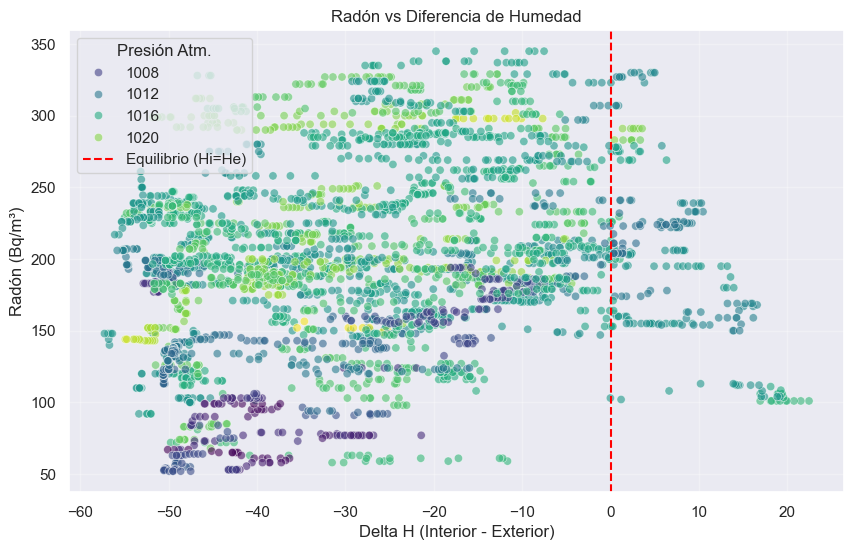

In [47]:
plt.figure(figsize=(10, 6))

# Scatter plot
sns.scatterplot(
    data=df_hr,
    x='diff_hr',
    y='radon_airthings',
    hue='Presion_meteo', # Coloreamos por presión para ver interacciones
    alpha=0.6,           # Transparencia para ver dónde hay más puntos
    palette='viridis'
)

# Línea de referencia en 0 (donde H_int = H_ext)
plt.axvline(x=0, color='red', linestyle='--', label='Equilibrio (Hi=He)')

plt.title('Radón vs Diferencia de Humedad')
plt.xlabel('Delta H (Interior - Exterior)')
plt.ylabel('Radón (Bq/m³)')
plt.legend(title='Presión Atm.', loc='upper left')
plt.grid(True, alpha=0.3)
plt.show()

Se observa que cuanto mayor es la diferencia de Humedad en el exterior con respecto al interior, es cuando más concentración de radón hay. También se puede ver el efecto de las altas presiones en el aumento de la concentración de radón.

**Añadir las variables con retardo al dataset**

Primero, se eliminann los caracteres de los nombres de las columnnas que darán problemas posteriormente al entrenar los modelos.

In [48]:
# Dar formato a nombres de columnas
def limpiar_nombre(nombre):
    nombre = nombre.replace(':', '_').replace(' ', '_').replace('.', '').replace('__', '_')
    nombre = re.sub(r'[^\w]', '', nombre)
    return nombre

df_modelo_a2 = df_final_nuevo.copy()
df_modelo_a2.columns = [limpiar_nombre(col) for col in df_modelo_a2.columns]
df_modelo_a2.columns

Index(['PMS5003_PM_25', 'MQ7_CO', 'SHT85_Temp', 'SHT85_Humedad_r',
       'GDK101_Radi_102', 'SCD30_CO2', 'radon_airthings', 'Temperatura_meteo',
       'Punto_de_Rocio_meteo', 'Velocidad_del_Viento_meteo', 'Presion_meteo',
       'Total_de_Precipitacion_meteo', 'Humedad_meteo'],
      dtype='object')

Añadir ahora las nuevas variables al dataset:


*   Variables temporales: el modelo no trabaja con la columna de la fecha tal y como está. Se crean dos nuevas variables para la hora y el mes y se añaden al dataset calculando las funciones seno y coseno para que el modelo aprenda que después de las 23:59 vienen las 00:00, y  que después del último mes del año, viene el primero del siguiente.
*   Variables retardadas: la presión exterior tiene correlación máxima con retardo de 6 horas. La temperatura interior, con un retardo de 10 horas.
*   Tendencias: es importante conocer la tendencia de la presión y la humedad externa, así como de la temperatura interna.
*   Media móvil de la presión externa a la 6 horas.
*   Diferencia de humedad interna y externa.

In [49]:
# Features temporales
df_modelo_a2['Hora'] = df_modelo_a2.index.hour
df_modelo_a2['Mes'] = df_modelo_a2.index.month
df_modelo_a2['Hora_Sin'] = np.sin(2 * np.pi * df_modelo_a2['Hora'] / 24.0)
df_modelo_a2['Hora_Cos'] = np.cos(2 * np.pi * df_modelo_a2['Hora'] / 24.0)
df_modelo_a2['Mes_Sin'] = np.sin(2 * np.pi * df_modelo_a2['Mes'] / 12.0)
df_modelo_a2['Mes_Cos'] = np.cos(2 * np.pi * df_modelo_a2['Mes'] / 12.0)

# Features derivadas con retardos óptimos para A2
df_modelo_a2['Presion_Lag_6h'] = df_modelo_a2['Presion_meteo'].shift(36)           # 6h = 36 intervalos
df_modelo_a2['Humedad_Lag_4h'] = df_modelo_a2['SHT85_Humedad_r'].shift(24)           # 4h = 24 intervalos

# Tendencias
df_modelo_a2['Presion_Tendencia_6h'] = df_modelo_a2['Presion_meteo'].diff(36)
df_modelo_a2['Humedad_Int_Tendencia_4h'] = df_modelo_a2['SHT85_Humedad_r'].diff(24)
df_modelo_a2['Temperatura_meteo_Tendencia_4h'] = df_modelo_a2['Temperatura_meteo'].diff(24)
df_modelo_a2['Temp_Int_Tendencia_6h'] = df_modelo_a2['SHT85_Temp'].diff(36)

# Medias móviles
df_modelo_a2['Presion_Media_6h'] = df_modelo_a2['Presion_meteo'].rolling(36).mean()
df_modelo_a2['Temp_Int_Media_10h'] = df_modelo_a2['SHT85_Temp'].rolling(60).mean() # 10h = 60 intervalos

# Diferencia de humedad
df_modelo_a2['Diff_Hum_In_Out'] = df_modelo_a2['SHT85_Humedad_r'] - df_modelo_a2['Humedad_meteo']

# Eliminar NaN generados por los lags
df_modelo_a2 = df_modelo_a2.dropna()

print(f"Registros finales: {len(df_modelo_a2)}")

Registros finales: 3177


In [50]:
df_modelo_a2.columns


Index(['PMS5003_PM_25', 'MQ7_CO', 'SHT85_Temp', 'SHT85_Humedad_r',
       'GDK101_Radi_102', 'SCD30_CO2', 'radon_airthings', 'Temperatura_meteo',
       'Punto_de_Rocio_meteo', 'Velocidad_del_Viento_meteo', 'Presion_meteo',
       'Total_de_Precipitacion_meteo', 'Humedad_meteo', 'Hora', 'Mes',
       'Hora_Sin', 'Hora_Cos', 'Mes_Sin', 'Mes_Cos', 'Presion_Lag_6h',
       'Humedad_Lag_4h', 'Presion_Tendencia_6h', 'Humedad_Int_Tendencia_4h',
       'Temperatura_meteo_Tendencia_4h', 'Temp_Int_Tendencia_6h',
       'Presion_Media_6h', 'Temp_Int_Media_10h', 'Diff_Hum_In_Out'],
      dtype='object')

# **Modelos**

In [51]:
features_a2 = [
    # Arduino (sin GDK101)
    'MQ7_CO',
    'SHT85_Temp',
    'SHT85_Humedad_r',
    'SCD30_CO2',
    'PMS5003_PM_25',

    # Meteo
    'Temperatura_meteo',
    'Punto_de_Rocio_meteo',
    'Velocidad_del_Viento_meteo',
    'Presion_meteo',
    'Total_de_Precipitacion_meteo',
    'Humedad_meteo',

    # Temporales
    'Hora_Sin', 'Hora_Cos', 'Mes_Sin', 'Mes_Cos',

    # Derivadas (lags óptimos para A2)
    'Presion_Lag_6h',
    'Humedad_Lag_4h',
    'Temp_Int_Media_10h',
    'Presion_Tendencia_6h',
    'Humedad_Int_Tendencia_4h',
    'Temp_Int_Tendencia_6h',
    'Presion_Media_6h',
    'Temperatura_meteo_Tendencia_4h',

    # Diferencia interior/exterior
    'Diff_Hum_In_Out'
]

print(f"Total features: {len(features_a2)}")

Total features: 24


In [52]:
# Modelos con sus grids de hiperparámetros
modelos = {
    'Ridge': {
        'modelo': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', Ridge())
        ]),
        'params': {
            'reg__alpha': [0.1, 1, 10, 100]
        }
    },
    'ElasticNet': {
        'modelo': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', ElasticNet(max_iter=10000))
        ]),
        'params': {
            'reg__alpha': [0.1, 1, 10],
            'reg__l1_ratio': [0.2, 0.5, 0.8]
        }
    },
    'RandomForest': {
        'modelo': RandomForestRegressor(random_state=42),
        'params': {
            'n_estimators': [100, 200],
            'max_depth': [10, 20, None],
            'min_samples_split': [2, 5]
        }
    },
    'XGBoost': {
        'modelo': XGBRegressor(random_state=42),
        'params': {
            'n_estimators': [100, 200],
            'max_depth': [3, 6, 10],
            'learning_rate': [0.05, 0.1],
            'subsample': [0.8, 1.0]
        }
    },
    'LightGBM': {
        'modelo': LGBMRegressor(random_state=42, verbose=-1),
        'params': {
            'n_estimators': [100, 200],
            'max_depth': [3, 6, 10],
            'learning_rate': [0.05, 0.1],
            'subsample': [0.8, 1.0]
        }
    }
}

horizontes = {
    '30min': 3,
    '1h': 6,
    '2h': 12,
    '3h': 18,
    '6h': 36
}

resultados = []

for nombre_horizonte, horizonte in horizontes.items():
    print(f"\n{'='*60}")
    print(f"HORIZONTE: {nombre_horizonte}")
    print('='*60)

    # Preparar datos
    df_temp = df_modelo_a2.copy()
    df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
    df_temp = df_temp.dropna()

    X = df_temp[features_a2]
    y = df_temp['radon_futuro']

    # Split 80/20
    split_idx = int(len(X) * 0.8)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    for nombre_modelo, config in modelos.items():
        print(f"\n  {nombre_modelo}...")

        grid = GridSearchCV(
            config['modelo'],
            config['params'],
            cv=3,
            scoring='r2',
            n_jobs=1
        )
        grid.fit(X_train, y_train)

        # Predicciones en train y test
        y_pred_train = grid.best_estimator_.predict(X_train)
        y_pred_test = grid.best_estimator_.predict(X_test)

        # Métricas en train
        r2_train = r2_score(y_train, y_pred_train)
        mae_train = mean_absolute_error(y_train, y_pred_train)

        # Métricas en test
        r2_test = r2_score(y_test, y_pred_test)
        mae_test = mean_absolute_error(y_test, y_pred_test)

        resultados.append({
            'horizonte': nombre_horizonte,
            'modelo': nombre_modelo,
            'R2_train': r2_train,
            'R2_test': r2_test,
            'Overfit': r2_train - r2_test,  # Diferencia indica overfitting
            'MAE_train': mae_train,
            'MAE_test': mae_test,
            'mejores_params': grid.best_params_,
            'mejor_estimador': grid.best_estimator_
        })

        print(f"  {nombre_modelo:15} → Train R²: {r2_train:.3f}, Test R²: {r2_test:.3f}, Overfit: {r2_train - r2_test:.3f}")

# Resumen
df_resultados = pd.DataFrame(resultados)

print("\n" + "="*60)
print("MEJOR MODELO POR HORIZONTE")
print("="*60)
mejores = df_resultados.loc[df_resultados.groupby('horizonte')['R2_test'].idxmax()]
print(mejores[['horizonte', 'modelo', 'R2_train', 'R2_test', 'Overfit', 'MAE_test']].to_string(index=False))


HORIZONTE: 30min

  Ridge...
  Ridge           → Train R²: 0.353, Test R²: 0.372, Overfit: -0.019

  ElasticNet...
  ElasticNet      → Train R²: 0.128, Test R²: -0.211, Overfit: 0.339

  RandomForest...
  RandomForest    → Train R²: 0.997, Test R²: 0.482, Overfit: 0.515

  XGBoost...
  XGBoost         → Train R²: 0.991, Test R²: 0.481, Overfit: 0.510

  LightGBM...
  LightGBM        → Train R²: 0.868, Test R²: 0.166, Overfit: 0.701

HORIZONTE: 1h

  Ridge...
  Ridge           → Train R²: 0.349, Test R²: 0.368, Overfit: -0.018

  ElasticNet...
  ElasticNet      → Train R²: 0.128, Test R²: -0.212, Overfit: 0.340

  RandomForest...
  RandomForest    → Train R²: 0.992, Test R²: 0.361, Overfit: 0.631

  XGBoost...
  XGBoost         → Train R²: 0.997, Test R²: 0.466, Overfit: 0.531

  LightGBM...
  LightGBM        → Train R²: 0.868, Test R²: 0.326, Overfit: 0.542

HORIZONTE: 2h

  Ridge...
  Ridge           → Train R²: 0.347, Test R²: 0.350, Overfit: -0.003

  ElasticNet...
  ElasticNet    

Todos los modelos tienen un severo sobreajuste. El modelo Ridge no sobreajusta tanto, pero tiene un R2 muy bajo, ya que las relaciones no son lineales en este dataset.


**Solución más regularizada para mejorar el sobreajuste**

Se descartan ya los modelos Ridge y ElasticNet por no funcionar bien con estos datos.

In [53]:
# Modelos con MUCHA regularización
modelos_regularizados = {
    'RandomForest': RandomForestRegressor(
        n_estimators=100,
        max_depth=4,              # Muy limitado
        min_samples_leaf=20,      # Alto
        min_samples_split=30,     # Alto
        max_features=0.5,         # Solo 50% de features
        random_state=42
    ),
    'XGBoost': XGBRegressor(
        n_estimators=100,
        max_depth=3,              # Muy limitado
        learning_rate=0.01,       # Muy bajo
        min_child_weight=20,      # Alto
        reg_alpha=5,              # Regularización L1 alta
        reg_lambda=10,            # Regularización L2 alta
        subsample=0.6,            # Submuestreo
        colsample_bytree=0.6,     # Submuestreo de features
        random_state=42
    ),
    'LightGBM': LGBMRegressor(
        n_estimators=100,
        max_depth=3,              # Muy limitado
        learning_rate=0.01,       # Muy bajo
        min_child_samples=50,     # Muy alto
        reg_alpha=5,              # Regularización L1 alta
        reg_lambda=10,            # Regularización L2 alta
        subsample=0.6,
        colsample_bytree=0.6,
        random_state=42,
        verbose=-1
    )
}

horizontes = {
    '30min': 3,
    '1h': 6,
    '2h': 12,
    '3h': 18,
    '6h': 36
}

resultados = []

for nombre_horizonte, horizonte in horizontes.items():
    print(f"\n{'='*60}")
    print(f"HORIZONTE: {nombre_horizonte}")
    print('='*60)

    # Preparar datos
    df_temp = df_modelo_a2.copy()
    df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
    df_temp = df_temp.dropna()

    X = df_temp[features_a2]
    y = df_temp['radon_futuro']

    # Split 80/20
    split_idx = int(len(X) * 0.8)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    for nombre, modelo in modelos_regularizados.items():
        modelo.fit(X_train, y_train)

        y_pred_train = modelo.predict(X_train)
        y_pred_test = modelo.predict(X_test)

        r2_train = r2_score(y_train, y_pred_train)
        r2_test = r2_score(y_test, y_pred_test)
        mae_test = mean_absolute_error(y_test, y_pred_test)

        print(f"\n{nombre}:")
        print(f"  R² Train: {r2_train:.3f}")
        print(f"  R² Test: {r2_test:.3f}")
        print(f"  Overfit: {r2_train - r2_test:.3f}")
        print(f"  MAE Test: {mae_test:.2f} Bq/m³")
        resultados.append({
                'horizonte': nombre_horizonte,
                'modelo': nombre_modelo,
                'R2_train': r2_train,
                'R2_test': r2_test,
                'Overfit': r2_train - r2_test,  # Diferencia indica overfitting
                'MAE_train': mae_train,
                'MAE_test': mae_test,
        })

        print(f"  {nombre_modelo:15} → Train R²: {r2_train:.3f}, Test R²: {r2_test:.3f}, Overfit: {r2_train - r2_test:.3f}")

# Resumen
df_resultados = pd.DataFrame(resultados)

print("\n" + "="*60)
print("MEJOR MODELO POR HORIZONTE")
print("="*60)
mejores = df_resultados.loc[df_resultados.groupby('horizonte')['R2_test'].idxmax()]
print(mejores[['horizonte', 'modelo', 'R2_train', 'R2_test', 'Overfit', 'MAE_test']].to_string(index=False))


HORIZONTE: 30min

RandomForest:
  R² Train: 0.780
  R² Test: 0.386
  Overfit: 0.395
  MAE Test: 39.04 Bq/m³
  LightGBM        → Train R²: 0.780, Test R²: 0.386, Overfit: 0.395

XGBoost:
  R² Train: 0.550
  R² Test: -0.295
  Overfit: 0.845
  MAE Test: 53.36 Bq/m³
  LightGBM        → Train R²: 0.550, Test R²: -0.295, Overfit: 0.845

LightGBM:
  R² Train: 0.557
  R² Test: -0.138
  Overfit: 0.695
  MAE Test: 49.98 Bq/m³
  LightGBM        → Train R²: 0.557, Test R²: -0.138, Overfit: 0.695

HORIZONTE: 1h

RandomForest:
  R² Train: 0.778
  R² Test: 0.369
  Overfit: 0.409
  MAE Test: 39.64 Bq/m³
  LightGBM        → Train R²: 0.778, Test R²: 0.369, Overfit: 0.409

XGBoost:
  R² Train: 0.548
  R² Test: -0.270
  Overfit: 0.818
  MAE Test: 52.68 Bq/m³
  LightGBM        → Train R²: 0.548, Test R²: -0.270, Overfit: 0.818

LightGBM:
  R² Train: 0.555
  R² Test: -0.150
  Overfit: 0.705
  MAE Test: 50.27 Bq/m³
  LightGBM        → Train R²: 0.555, Test R²: -0.150, Overfit: 0.705

HORIZONTE: 2h

RandomF

Los modelos tienen ahora menos sobreajuste, pero un R2 más bajo.

**Importancia de las variables del mejor modelo (LightGBM con horizonte temporal de 1 hora)**

Importancia de features:
                       feature  importancia
            Temp_Int_Media_10h          229
              Presion_Media_6h          130
                 PMS5003_PM_25          107
                    SHT85_Temp          101
          Presion_Tendencia_6h           86
          Punto_de_Rocio_meteo           82
                 Presion_meteo           82
                Presion_Lag_6h           77
                Humedad_Lag_4h           55
               SHT85_Humedad_r           54
                     SCD30_CO2           49
                        MQ7_CO           41
      Humedad_Int_Tendencia_4h           39
                 Humedad_meteo           37
  Total_de_Precipitacion_meteo           37
             Temperatura_meteo           35
                       Mes_Cos           34
Temperatura_meteo_Tendencia_4h           34
         Temp_Int_Tendencia_6h           23
               Diff_Hum_In_Out           23
                       Mes_Sin           21
       

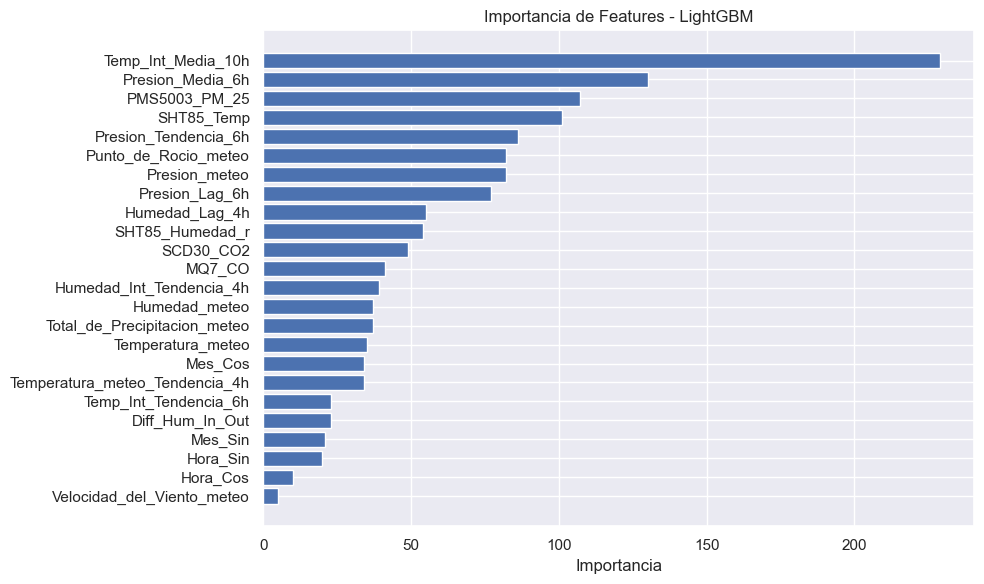

In [54]:
# Entrenar el mejor modelo
horizonte = 6  # 1h

df_temp = df_modelo_a2.copy()
df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
df_temp = df_temp.dropna()

X = df_temp[features_a2]
y = df_temp['radon_futuro']

split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]

modelo_lgbm = LGBMRegressor(
    n_estimators=100,
    max_depth=4,
    learning_rate=0.03,
    min_child_samples=20,
    reg_alpha=1,
    reg_lambda=3,
    subsample=0.7,
    colsample_bytree=0.7,
    random_state=42,
    verbose=-1
)
modelo_lgbm.fit(X_train, y_train)

# Importancia de features
importancia = pd.DataFrame({
    'feature': features_a2,
    'importancia': modelo_lgbm.feature_importances_
}).sort_values('importancia', ascending=False)

print("Importancia de features:")
print(importancia.to_string(index=False))

# Gráfico
plt.figure(figsize=(10, 6))
plt.barh(importancia['feature'], importancia['importancia'])
plt.xlabel('Importancia')
plt.title('Importancia de Features - LightGBM')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

La variable Temperatura interior media 10 horas es la que más importancia tiene, junto con la Presión media y la temperatura interior actual.

La variable de Temperatura exterior tiene más importancia que las variables de tendencia a las 4 horas, por lo que esta última se va a eliminar.

La variable de tendencia de la Temperatura interior también se va a eliminar.

Las variables temporales Hora_Cos, Mes_Sin y Mes_Cos tienen poca importancia. En el caso del mes, puede ser porque no se tiene un ciclo completo de mediciones, por lo que se va a eliminar.

La variable Velocidad del Viento, ya se vio que tenía poca correlación con el radón, por lo que se va a eliminar del modelo.

La diferencia de humedad, tampoco parece que tenga mucha importancia, por lo que se va a eliminar para evitar sobreajuste.

**Eliminar las variables con menor importancia antes de ajustar el modelo**

In [55]:
features_reducidas = [
    # Arduino (sin GDK101)
    'MQ7_CO',
    'SHT85_Temp',
    'SHT85_Humedad_r',
    'SCD30_CO2',
    'PMS5003_PM_25',

    # Meteo
    'Temperatura_meteo',
    'Presion_meteo',
    'Total_de_Precipitacion_meteo',
    'Humedad_meteo',

    # Temporales
    'Hora_Sin', 'Hora_Cos',

    # Derivadas (lags óptimos para A2)
    'Presion_Lag_6h',
    'Humedad_Lag_4h',
    'Temp_Int_Media_10h',
    'Presion_Tendencia_6h',
    'Humedad_Int_Tendencia_4h',
    'Presion_Media_6h',
]

print(f"Total features: {len(features_reducidas)}")

Total features: 17


**Regularización Intermedia**

In [56]:
modelos_intermedio = {
    'RandomForest': RandomForestRegressor(
        n_estimators=100,
        max_depth=6,              # Intermedio
        min_samples_leaf=10,      # Intermedio
        min_samples_split=15,
        max_features='sqrt',
        random_state=42
    ),
    'XGBoost': XGBRegressor(
        n_estimators=100,
        max_depth=4,              # Intermedio
        learning_rate=0.03,       # Intermedio
        min_child_weight=10,
        reg_alpha=1,              # Moderada
        reg_lambda=3,             # Moderada
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42
    ),
    'LightGBM': LGBMRegressor(
        n_estimators=100,
        max_depth=4,              # Intermedio
        learning_rate=0.03,       # Intermedio
        min_child_samples=20,     # Intermedio
        reg_alpha=1,
        reg_lambda=3,
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42,
        verbose=-1
    )
}

# Probar todos los horizontes
horizontes = {'30min': 3, '1h': 6, '2h': 12, '3h': 18}

resultados = []

for nombre_h, horizonte in horizontes.items():
    df_temp = df_modelo_a2.copy()
    df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
    df_temp = df_temp.dropna()

    X = df_temp[features_reducidas]
    y = df_temp['radon_futuro']

    split_idx = int(len(X) * 0.8)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    for nombre_m, modelo in modelos_intermedio.items():
        modelo_clone = modelo.__class__(**modelo.get_params())
        modelo_clone.fit(X_train, y_train)

        r2_train = r2_score(y_train, modelo_clone.predict(X_train))
        r2_test = r2_score(y_test, modelo_clone.predict(X_test))
        mae_test = mean_absolute_error(y_test, modelo_clone.predict(X_test))

        resultados.append({
            'horizonte': nombre_h,
            'modelo': nombre_m,
            'R2_train': r2_train,
            'R2_test': r2_test,
            'Overfit': r2_train - r2_test,
            'MAE_test': mae_test,
        })

df_res = pd.DataFrame(resultados)
print("\nResultados regularización intermedia:")
print("="*70)
print(df_res.sort_values('R2_test', ascending=False).head(10).to_string(index=False))


Resultados regularización intermedia:
horizonte       modelo  R2_train  R2_test  Overfit  MAE_test
       2h     LightGBM  0.884086 0.405795 0.478290 38.307262
       1h     LightGBM  0.889517 0.387164 0.502353 37.642189
       3h     LightGBM  0.897246 0.386336 0.510910 39.053994
       1h      XGBoost  0.884709 0.339717 0.544992 38.875445
    30min     LightGBM  0.890554 0.301998 0.588556 40.999080
       2h      XGBoost  0.888775 0.291682 0.597093 40.967005
    30min RandomForest  0.879654 0.277705 0.601949 41.192453
       1h RandomForest  0.876635 0.272787 0.603848 40.423336
    30min      XGBoost  0.887686 0.244588 0.643097 41.902281
       3h      XGBoost  0.893740 0.235866 0.657874 42.673396


Se han obtenido valores de R2 mejores, aunque el sobreajuste sigue siendo muy alto, seguramente debido a que probablemente sigue habiendo muchas variables predictoras que aportan poca información o que están muy correlacionadas.

**Ver la importancia de las variables en este nuevo modelo.**

Importancia de features:
                     feature  importancia
          Temp_Int_Media_10h          230
            Presion_Media_6h          165
                  SHT85_Temp          125
               PMS5003_PM_25          115
               Presion_meteo          105
              Humedad_Lag_4h           87
        Presion_Tendencia_6h           81
               Humedad_meteo           74
                   SCD30_CO2           72
             SHT85_Humedad_r           62
    Humedad_Int_Tendencia_4h           62
              Presion_Lag_6h           53
                      MQ7_CO           44
Total_de_Precipitacion_meteo           42
                    Hora_Sin           34
           Temperatura_meteo           24
                    Hora_Cos           17


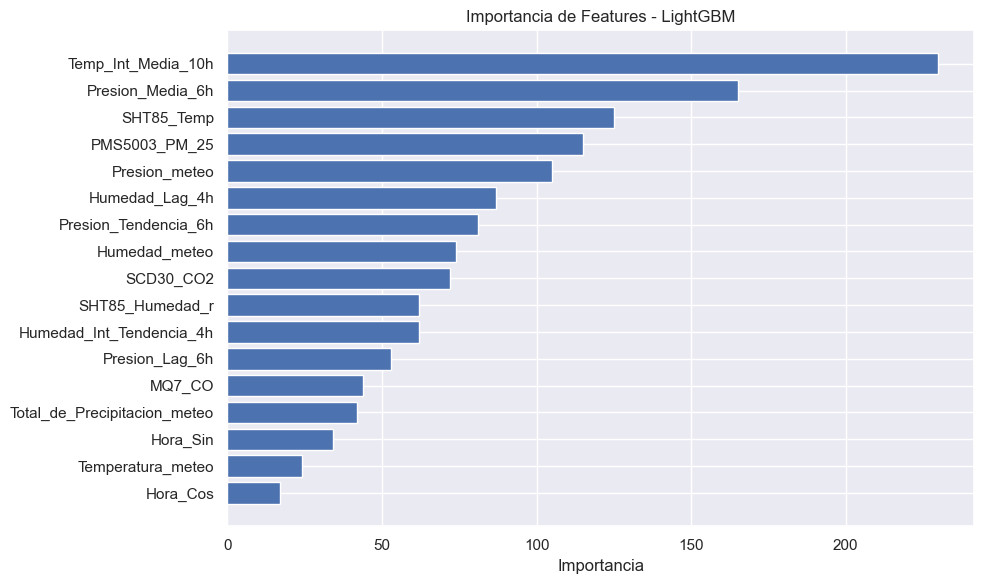

In [57]:
# Entrenar el mejor modelo (LigthGBM con horizonte de 2 horas)
horizonte = 12  # 2h

df_temp = df_modelo_a2.copy()
df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
df_temp = df_temp.dropna()

X = df_temp[features_reducidas]
y = df_temp['radon_futuro']

split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]

modelo_lgbm = LGBMRegressor(
    n_estimators=100,
    max_depth=4,
    learning_rate=0.03,
    min_child_samples=20,
    reg_alpha=1,
    reg_lambda=3,
    subsample=0.7,
    colsample_bytree=0.7,
    random_state=42,
    verbose=-1
)
modelo_lgbm.fit(X_train, y_train)

# Importancia de features
importancia = pd.DataFrame({
    'feature': features_reducidas,
    'importancia': modelo_lgbm.feature_importances_
}).sort_values('importancia', ascending=False)

print("Importancia de features:")
print(importancia.to_string(index=False))

# Gráfico
plt.figure(figsize=(10, 6))
plt.barh(importancia['feature'], importancia['importancia'])
plt.xlabel('Importancia')
plt.title('Importancia de Features - LightGBM')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

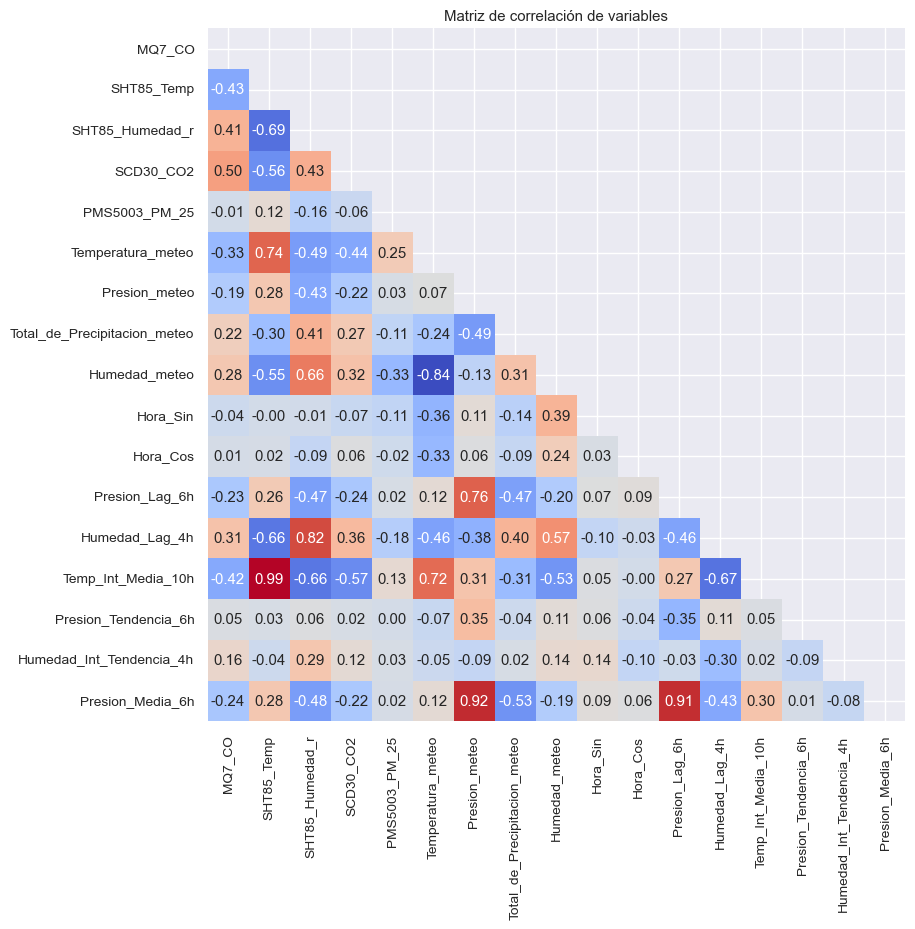

In [58]:
df_features = df_modelo_a2[features_reducidas]
correlation_matrix = df_features.corr(numeric_only=True)

# Crear una máscara para ocultar la mitad superior de la matriz (simetría)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
plt.figure(figsize=(9, 9))
sns.set(font_scale=0.9)

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar=False, mask=mask)

plt.title("Matriz de correlación de variables")
plt.show()

Se puede ver la fuerte correlación entre la variable de Temperatura Interior Media a las 10 horas y la Temperatura Interior sin retardo, lo cual, es lógico.

La variable Presión media 6 horas está muy correlacionada con la Presión en el instante actual y la presión con retardo, por lo que se va a eliminar.

In [59]:
features_mas_reducidas = [
    'MQ7_CO',
    'SHT85_Temp',
    'SHT85_Humedad_r',
    'SCD30_CO2',
    'PMS5003_PM_25',

    # Meteo
    'Temperatura_meteo',
    'Presion_meteo',
    'Total_de_Precipitacion_meteo',
    'Humedad_meteo',

    # Temporales
    'Hora_Sin', 'Hora_Cos',

    # Derivadas (lags óptimos para A2)
    'Presion_Lag_6h',
    'Humedad_Lag_4h',
    'Temp_Int_Media_10h',
    'Presion_Tendencia_6h',
    'Humedad_Int_Tendencia_4h',
]

print(f"Total features: {len(features_mas_reducidas)}")

Total features: 16


**Entrenar el modelo con las variables reducidas y más árboles (n_estimators=150)**

In [60]:
modelos_intermedio = {
    'RandomForest': RandomForestRegressor(
        n_estimators=150,
        max_depth=6,              # Intermedio
        min_samples_leaf=10,      # Intermedio
        min_samples_split=15,
        max_features='sqrt',
        random_state=42
    ),
    'XGBoost': XGBRegressor(
        n_estimators=150,
        max_depth=4,              # Intermedio
        learning_rate=0.03,       # Intermedio
        min_child_weight=10,
        reg_alpha=1,              # Moderada
        reg_lambda=3,             # Moderada
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42
    ),
    'LightGBM': LGBMRegressor(
        n_estimators=150,
        max_depth=4,              # Intermedio
        learning_rate=0.03,       # Intermedio
        min_child_samples=20,     # Intermedio
        reg_alpha=1,
        reg_lambda=3,
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42,
        verbose=-1
    )
}

# Probar todos los horizontes
horizontes = {'30min': 3, '1h': 6, '2h': 12, '3h': 18}

resultados = []

for nombre_h, horizonte in horizontes.items():
    df_temp = df_modelo_a2.copy()
    df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
    df_temp = df_temp.dropna()

    X = df_temp[features_mas_reducidas]
    y = df_temp['radon_futuro']

    split_idx = int(len(X) * 0.8)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    for nombre_m, modelo in modelos_intermedio.items():
        modelo_clone = modelo.__class__(**modelo.get_params())
        modelo_clone.fit(X_train, y_train)

        r2_train = r2_score(y_train, modelo_clone.predict(X_train))
        r2_test = r2_score(y_test, modelo_clone.predict(X_test))
        mae_test = mean_absolute_error(y_test, modelo_clone.predict(X_test))

        resultados.append({
            'horizonte': nombre_h,
            'modelo': nombre_m,
            'R2_train': r2_train,
            'R2_test': r2_test,
            'Overfit': r2_train - r2_test,
            'MAE_test': mae_test,
        })

df_res = pd.DataFrame(resultados)
print("\nResultados regularización intermedia:")
print("="*70)
print(df_res.sort_values('R2_test', ascending=False).head(10).to_string(index=False))


Resultados regularización intermedia:
horizonte       modelo  R2_train  R2_test  Overfit  MAE_test
       2h     LightGBM  0.916245 0.488517 0.427727 35.369457
       3h     LightGBM  0.921549 0.390478 0.531071 38.583996
       1h      XGBoost  0.915500 0.329765 0.585734 39.234358
       2h      XGBoost  0.918122 0.313569 0.604553 40.186661
       1h     LightGBM  0.915791 0.303035 0.612756 39.028450
    30min      XGBoost  0.917448 0.271618 0.645831 41.426051
    30min     LightGBM  0.917937 0.261433 0.656504 41.727422
       3h      XGBoost  0.921581 0.250647 0.670934 41.678049
       1h RandomForest  0.865959 0.220400 0.645559 41.302914
    30min RandomForest  0.869542 0.189180 0.680361 41.790402


Se ha conseguido mejorar el R2 (de 0.40 a 0.48) y el overfit (de 0.47 a 0.42), pero los valores siguen sin ser buenos, por lo que se van a reducir aún más las variables para ver si mejoran.


**Ver la importancia de las variables de este nuevo modelo (LightGBM con horizonte 2 horas)**

Importancia de features:
                     feature  importancia
          Temp_Int_Media_10h          322
               Presion_meteo          237
               Humedad_meteo          156
                  SHT85_Temp          141
               PMS5003_PM_25          128
              Presion_Lag_6h          125
              Humedad_Lag_4h          125
        Presion_Tendencia_6h          115
             SHT85_Humedad_r          102
                   SCD30_CO2           92
    Humedad_Int_Tendencia_4h           89
           Temperatura_meteo           80
Total_de_Precipitacion_meteo           73
                      MQ7_CO           68
                    Hora_Sin           56
                    Hora_Cos           45


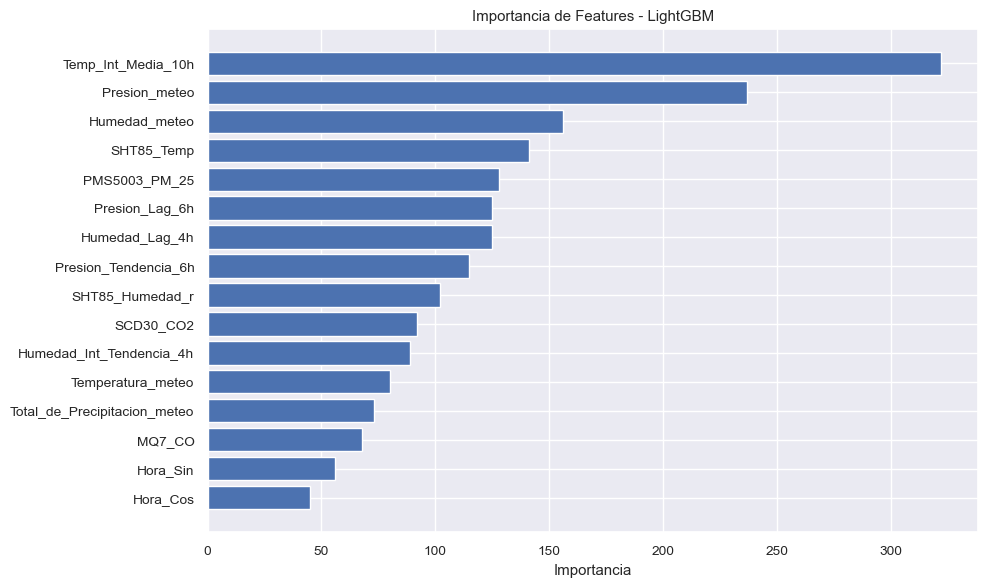

In [61]:
# Entrenar el mejor modelo con el mejor horizonte (2h basado en resultados anteriores)
horizonte = 12  # 2h

df_temp = df_modelo_a2.copy()
df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
df_temp = df_temp.dropna()

X = df_temp[features_mas_reducidas]
y = df_temp['radon_futuro']

split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]

modelo_xgbm = LGBMRegressor(
    n_estimators=150,
    max_depth=4,
    learning_rate=0.03,
    min_child_samples=20,
    reg_alpha=1,
    reg_lambda=3,
    subsample=0.7,
    colsample_bytree=0.7,
    random_state=42,
    verbose=-1
)
modelo_xgbm.fit(X_train, y_train)

# Importancia de features
importancia = pd.DataFrame({
    'feature': features_mas_reducidas,
    'importancia': modelo_xgbm.feature_importances_
}).sort_values('importancia', ascending=False)

print("Importancia de features:")
print(importancia.to_string(index=False))

# Gráfico
plt.figure(figsize=(10, 6))
plt.barh(importancia['feature'], importancia['importancia'])
plt.xlabel('Importancia')
plt.title('Importancia de Features - LightGBM')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

A las variables CO y Total de precipitación no se les da mucho importancia, por lo que se van a eliminar. En el caso de Total de Precipitación, ya se vio al principio que no aportaba mucho información, por haberse tomado las muestras en una época sin precipitaciones. Se va a hacer un último intento con las variables temporales (Hora_Sin y Hora_Cos)

In [62]:
features_mas_reducidas = [
    'SHT85_Temp',
    'SHT85_Humedad_r',
    'SCD30_CO2',
    'PMS5003_PM_25',

    # Meteo
    'Temperatura_meteo',
    'Presion_meteo',
    'Humedad_meteo',

    # Temporales
    'Hora_Sin', 'Hora_Cos',

    # Derivadas (lags óptimos para A2)
    'Presion_Lag_6h',
    'Humedad_Lag_4h',
    'Temp_Int_Media_10h',
    'Presion_Tendencia_6h',
    'Humedad_Int_Tendencia_4h'
]

print(f"Total features: {len(features_mas_reducidas)}")

Total features: 14


In [63]:
modelos_intermedio = {
    'RandomForest': RandomForestRegressor(
        n_estimators=150,
        max_depth=6,              # Intermedio
        min_samples_leaf=10,      # Intermedio
        min_samples_split=15,
        max_features='sqrt',
        random_state=42
    ),
    'XGBoost': XGBRegressor(
        n_estimators=150,
        max_depth=4,              # Intermedio
        learning_rate=0.03,       # Intermedio
        min_child_weight=10,
        reg_alpha=1,              # Moderada
        reg_lambda=3,             # Moderada
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42
    ),
    'LightGBM': LGBMRegressor(
        n_estimators=150,
        max_depth=4,              # Intermedio
        learning_rate=0.03,       # Intermedio
        min_child_samples=20,     # Intermedio
        reg_alpha=1,
        reg_lambda=3,
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42,
        verbose=-1
    )
}

# Probar todos los horizontes
horizontes = {'30min': 3, '1h': 6, '2h': 12, '3h': 18}

resultados = []

for nombre_h, horizonte in horizontes.items():
    df_temp = df_modelo_a2.copy()
    df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
    df_temp = df_temp.dropna()

    X = df_temp[features_mas_reducidas]
    y = df_temp['radon_futuro']

    split_idx = int(len(X) * 0.8)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    for nombre_m, modelo in modelos_intermedio.items():
        modelo_clone = modelo.__class__(**modelo.get_params())
        modelo_clone.fit(X_train, y_train)

        r2_train = r2_score(y_train, modelo_clone.predict(X_train))
        r2_test = r2_score(y_test, modelo_clone.predict(X_test))
        mae_test = mean_absolute_error(y_test, modelo_clone.predict(X_test))

        resultados.append({
            'horizonte': nombre_h,
            'modelo': nombre_m,
            'R2_train': r2_train,
            'R2_test': r2_test,
            'Overfit': r2_train - r2_test,
            'MAE_test': mae_test,
        })

df_res = pd.DataFrame(resultados)
print("\nResultados regularización intermedia:")
print("="*70)
print(df_res.sort_values('R2_test', ascending=False).head(10).to_string(index=False))


Resultados regularización intermedia:
horizonte       modelo  R2_train  R2_test  Overfit  MAE_test
       1h     LightGBM  0.918082 0.506641 0.411441 36.304499
       2h     LightGBM  0.915516 0.491232 0.424284 37.030020
       3h     LightGBM  0.918211 0.383120 0.535091 39.702162
    30min     LightGBM  0.922724 0.374445 0.548279 39.106669
       1h      XGBoost  0.914923 0.349133 0.565790 40.949684
    30min      XGBoost  0.918465 0.333661 0.584804 41.060550
       2h      XGBoost  0.915542 0.299360 0.616182 41.688755
       3h      XGBoost  0.916962 0.245157 0.671805 43.180840
    30min RandomForest  0.854302 0.098310 0.755992 45.096838
       2h RandomForest  0.851879 0.089222 0.762658 45.650892


Siguen mejorando los valores de R2 (de 0.488 a 0.506) y overfit (de 0.427 a 0.411), pero sigue habiendo un sobreajuste severo.

**Ver qué variables tienen menos importancia ahora**

Importancia de features:
                 feature  importancia
      Temp_Int_Media_10h          416
           Presion_meteo          210
          Presion_Lag_6h          187
              SHT85_Temp          166
           PMS5003_PM_25          155
               SCD30_CO2          136
    Presion_Tendencia_6h          126
          Humedad_Lag_4h          115
       Temperatura_meteo          103
         SHT85_Humedad_r          100
Humedad_Int_Tendencia_4h           96
           Humedad_meteo           94
                Hora_Sin           76
                Hora_Cos           36


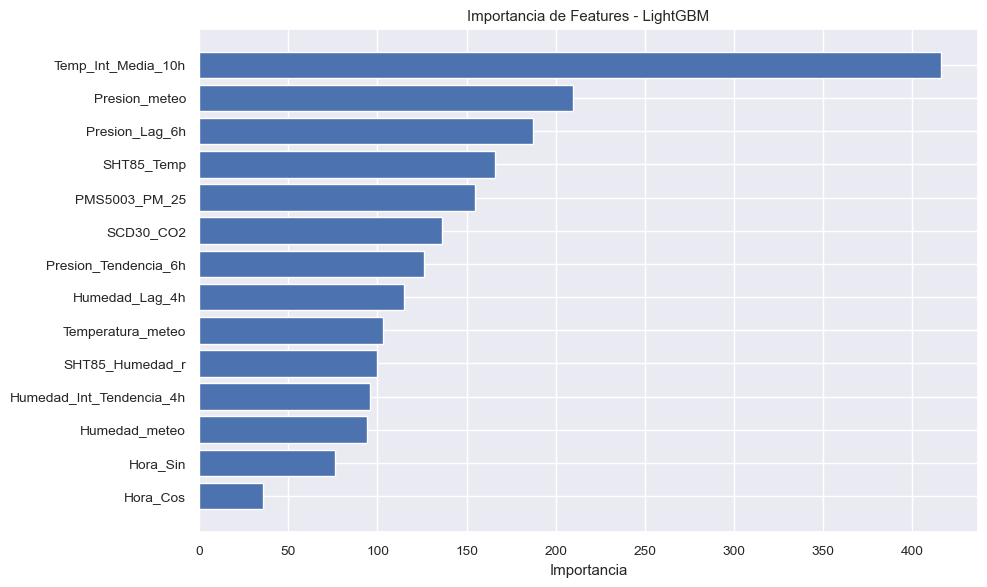

In [64]:
# Entrenar el mejor modelo
horizonte = 6  # 1h

df_temp = df_modelo_a2.copy()
df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
df_temp = df_temp.dropna()

X = df_temp[features_mas_reducidas]
y = df_temp['radon_futuro']

split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]

modelo_lgbm = LGBMRegressor(
    n_estimators=150,
    max_depth=4,
    learning_rate=0.03,
    min_child_samples=20,
    reg_alpha=1,
    reg_lambda=3,
    subsample=0.7,
    colsample_bytree=0.7,
    random_state=42,
    verbose=-1
)
modelo_lgbm.fit(X_train, y_train)

# Importancia de features
importancia = pd.DataFrame({
    'feature': features_mas_reducidas,
    'importancia': modelo_lgbm.feature_importances_
}).sort_values('importancia', ascending=False)

print("Importancia de features:")
print(importancia.to_string(index=False))

# Gráfico
plt.figure(figsize=(10, 6))
plt.barh(importancia['feature'], importancia['importancia'])
plt.xlabel('Importancia')
plt.title('Importancia de Features - LightGBM')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

**Probar eliminando las variables temporales y las variable de Tendencia de humedad interna**

In [65]:
features_mas_reducidas = [
    'SHT85_Temp',
    'SHT85_Humedad_r',
    'PMS5003_PM_25',

    # Meteo
    'Temperatura_meteo',
    'Presion_meteo',
    'Humedad_meteo',

    # Derivadas (lags óptimos para A2)
    'Presion_Lag_6h',
    'Humedad_Lag_4h',
    'Temp_Int_Media_10h',
    'Presion_Tendencia_6h',
]

print(f"Total features: {len(features_mas_reducidas)}")

Total features: 10


In [66]:
modelos_intermedio = {
    'RandomForest': RandomForestRegressor(
        n_estimators=150,
        max_depth=6,              # Intermedio
        min_samples_leaf=10,      # Intermedio
        min_samples_split=15,
        max_features='sqrt',
        random_state=42
    ),
    'XGBoost': XGBRegressor(
        n_estimators=150,
        max_depth=4,              # Intermedio
        learning_rate=0.03,       # Intermedio
        min_child_weight=10,
        reg_alpha=1,              # Moderada
        reg_lambda=3,             # Moderada
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42
    ),
    'LightGBM': LGBMRegressor(
        n_estimators=150,
        max_depth=4,              # Intermedio
        learning_rate=0.03,       # Intermedio
        min_child_samples=20,     # Intermedio
        reg_alpha=1,
        reg_lambda=3,
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42,
        verbose=-1
    )
}

# Probar todos los horizontes
horizontes = {'30min': 3, '1h': 6, '2h': 12, '3h': 18}

resultados = []

for nombre_h, horizonte in horizontes.items():
    df_temp = df_modelo_a2.copy()
    df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
    df_temp = df_temp.dropna()

    X = df_temp[features_mas_reducidas]
    y = df_temp['radon_futuro']

    split_idx = int(len(X) * 0.8)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    for nombre_m, modelo in modelos_intermedio.items():
        modelo_clone = modelo.__class__(**modelo.get_params())
        modelo_clone.fit(X_train, y_train)

        r2_train = r2_score(y_train, modelo_clone.predict(X_train))
        r2_test = r2_score(y_test, modelo_clone.predict(X_test))
        mae_test = mean_absolute_error(y_test, modelo_clone.predict(X_test))

        resultados.append({
            'horizonte': nombre_h,
            'modelo': nombre_m,
            'R2_train': r2_train,
            'R2_test': r2_test,
            'Overfit': r2_train - r2_test,
            'MAE_test': mae_test,
        })

df_res = pd.DataFrame(resultados)
print("\nResultados regularización intermedia:")
print("="*70)
print(df_res.sort_values('R2_test', ascending=False).head(10).to_string(index=False))


Resultados regularización intermedia:
horizonte       modelo  R2_train  R2_test  Overfit  MAE_test
       1h     LightGBM  0.906360 0.466799 0.439561 37.786521
       2h     LightGBM  0.903539 0.447679 0.455861 38.017580
    30min     LightGBM  0.912827 0.436591 0.476235 37.825779
       2h      XGBoost  0.905253 0.415606 0.489648 38.925171
       1h      XGBoost  0.906765 0.391610 0.515156 38.915293
       3h     LightGBM  0.910666 0.373495 0.537171 40.233666
    30min      XGBoost  0.911492 0.361634 0.549859 39.577955
       3h      XGBoost  0.914468 0.348909 0.565559 40.018563
       1h RandomForest  0.877347 0.235238 0.642109 41.996512
       2h RandomForest  0.874084 0.181345 0.692739 43.589201


Vuelve a aumentar el overfit y a reducir el R2.

# **Decisión**

Puesto que no se obtiene mejora, se va a entrenar un modelo con unas variables mínimas, que serán las que mayor correlación presentaron con el radón.


Para capturar la correlación en el tiempo, se utilizarán también solo las variables creadas que mayor correlación tenían con el radón.
Como variables temporales, se utilizarán las funciones de la Hora, ya que se vio que la hora afectaba a la concentración de radón.
La variable derivada de Temperatura Interior Media tiene que introducirse, ya todos los modelos probados le daban la mayor importancia de forma unánime.

In [67]:
# Features mínimas basadas en correlaciones más altas
features_minimas = [
    # Las 3 con mayor correlación con radón
    'SHT85_Humedad_r',      # -0.54
    'Presion_meteo',        # 0.40
    'SHT85_Temp',           # 0.36

    # Lags óptimos
    'Humedad_Lag_4h',
    'Presion_Lag_6h',

    # Una feature derivada
    'Temp_Int_Media_10h',

    # Temporales (mínimas)
    'Hora_Sin',
    'Hora_Cos'
]

print(f"Features: {len(features_minimas)}")

Features: 8


**Entrenar los modelos con este conjunto de variables mínimas**

In [68]:
modelos_intermedio = {
    'RandomForest': RandomForestRegressor(
        n_estimators=150,
        max_depth=6,              # Intermedio
        min_samples_leaf=10,      # Intermedio
        min_samples_split=15,
        max_features='sqrt',
        random_state=42
    ),
    'XGBoost': XGBRegressor(
        n_estimators=150,
        max_depth=4,              # Intermedio
        learning_rate=0.03,       # Intermedio
        min_child_weight=10,
        reg_alpha=1,              # Moderada
        reg_lambda=3,             # Moderada
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42
    ),
    'LightGBM': LGBMRegressor(
        n_estimators=150,
        max_depth=4,              # Intermedio
        learning_rate=0.03,       # Intermedio
        min_child_samples=20,     # Intermedio
        reg_alpha=1,
        reg_lambda=3,
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42,
        verbose=-1
    )
}

# Probar todos los horizontes
horizontes = {'30min': 3, '1h': 6, '2h': 12, '3h': 18}

resultados = []

for nombre_h, horizonte in horizontes.items():
    df_temp = df_modelo_a2.copy()
    df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
    df_temp = df_temp.dropna()

    X = df_temp[features_minimas]
    y = df_temp['radon_futuro']

    split_idx = int(len(X) * 0.8)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    for nombre_m, modelo in modelos_intermedio.items():
        modelo_clone = modelo.__class__(**modelo.get_params())
        modelo_clone.fit(X_train, y_train)

        r2_train = r2_score(y_train, modelo_clone.predict(X_train))
        r2_test = r2_score(y_test, modelo_clone.predict(X_test))
        mae_test = mean_absolute_error(y_test, modelo_clone.predict(X_test))

        resultados.append({
            'horizonte': nombre_h,
            'modelo': nombre_m,
            'R2_train': r2_train,
            'R2_test': r2_test,
            'Overfit': r2_train - r2_test,
            'MAE_test': mae_test,
        })

df_res = pd.DataFrame(resultados)
print("\nResultados regularización intermedia:")
print("="*70)
print(df_res.sort_values('R2_test', ascending=False).head(10).to_string(index=False))


Resultados regularización intermedia:
horizonte       modelo  R2_train  R2_test  Overfit  MAE_test
       1h     LightGBM  0.893654 0.592111 0.301543 31.978995
    30min     LightGBM  0.906028 0.563344 0.342684 33.177013
       2h     LightGBM  0.897238 0.541115 0.356123 33.177742
       1h      XGBoost  0.903929 0.456819 0.447111 35.649732
    30min      XGBoost  0.906576 0.449954 0.456622 36.086948
       2h      XGBoost  0.901970 0.409055 0.492915 36.885273
       3h     LightGBM  0.897204 0.366937 0.530266 37.604446
       3h      XGBoost  0.900460 0.331650 0.568810 39.475093
       1h RandomForest  0.843234 0.264998 0.578236 40.958812
       2h RandomForest  0.842886 0.237226 0.605660 42.176541


**Se ha conseguido los mejores valores de R2, overfit, y MAE hasta ahora.**

Teniendo en cuenta el dataset del que se ha partido, estos valores se consideran aceptables, ya que se ha conseguido que solo haya un overfit moderado y que se capture aproximadamente el 32% de la variabilidad del radón.

**Probar ajustando parámetros para ver si todavía se obtiene algo de mejora**

In [69]:
# Horizonte 1h
horizonte = 6

df_temp = df_modelo_a2.copy()
df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
df_temp = df_temp.dropna()

X = df_temp[features_minimas]
y = df_temp['radon_futuro']

split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]

# Configuraciones a probar
configs = {
    'Actual': {
        'max_depth': 4, 'num_leaves': 31, 'min_child_samples': 20,
        'reg_alpha': 1, 'reg_lambda': 3, 'learning_rate': 0.03
    },
    'Menos profundo': {
        'max_depth': 3, 'num_leaves': 8, 'min_child_samples': 20,
        'reg_alpha': 1, 'reg_lambda': 3, 'learning_rate': 0.03
    },
    'Más muestras hoja': {
        'max_depth': 4, 'num_leaves': 15, 'min_child_samples': 40,
        'reg_alpha': 1, 'reg_lambda': 3, 'learning_rate': 0.03
    },
    'Más regularización': {
        'max_depth': 4, 'num_leaves': 15, 'min_child_samples': 20,
        'reg_alpha': 3, 'reg_lambda': 8, 'learning_rate': 0.03
    },
    'Learning rate bajo': {
        'max_depth': 4, 'num_leaves': 15, 'min_child_samples': 20,
        'reg_alpha': 1, 'reg_lambda': 3, 'learning_rate': 0.01
    },
    'Combinado': {
        'max_depth': 3, 'num_leaves': 8, 'min_child_samples': 30,
        'reg_alpha': 2, 'reg_lambda': 5, 'learning_rate': 0.02
    }
}

print("Comparativa de configuraciones:")
print("="*80)

resultados = []
for nombre, params in configs.items():
    modelo = LGBMRegressor(
        n_estimators=150,
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42,
        verbose=-1,
        **params
    )

    modelo.fit(X_train, y_train)

    r2_train = r2_score(y_train, modelo.predict(X_train))
    r2_test = r2_score(y_test, modelo.predict(X_test))
    mae_test = mean_absolute_error(y_test, modelo.predict(X_test))

    resultados.append({
        'Config': nombre,
        'R2_train': r2_train,
        'R2_test': r2_test,
        'Overfit': r2_train - r2_test,
        'MAE': mae_test
    })

    print(f"{nombre:20} | R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f} | Overfit: {r2_train-r2_test:.3f} | MAE: {mae_test:.1f}")

# Mejor configuración
df_res = pd.DataFrame(resultados)
mejor = df_res.loc[df_res['Overfit'].idxmin()]
print(f"\n→ Menor overfit: {mejor['Config']}")
mejor = df_res.loc[df_res['R2_test'].idxmax()]
print(f"→ Mayor R² test: {mejor['Config']}")

Comparativa de configuraciones:
Actual               | R² Train: 0.894 | R² Test: 0.592 | Overfit: 0.302 | MAE: 32.0
Menos profundo       | R² Train: 0.800 | R² Test: 0.386 | Overfit: 0.415 | MAE: 38.5
Más muestras hoja    | R² Train: 0.890 | R² Test: 0.575 | Overfit: 0.315 | MAE: 32.6
Más regularización   | R² Train: 0.887 | R² Test: 0.579 | Overfit: 0.308 | MAE: 32.4
Learning rate bajo   | R² Train: 0.744 | R² Test: 0.415 | Overfit: 0.329 | MAE: 36.1
Combinado            | R² Train: 0.748 | R² Test: 0.282 | Overfit: 0.466 | MAE: 41.0

→ Menor overfit: Actual
→ Mayor R² test: Actual


Los parámetros que mejor funcionan son los que se han utilizado anteriormente, no se consigue mejora con una configuración diferente.

In [70]:
# Probar diferentes números de árboles
for n_est in [100, 150, 200, 250]:
    modelo = LGBMRegressor(
        n_estimators=n_est,
        max_depth=4,
        num_leaves=31,
        min_child_samples=20,
        reg_alpha=1,
        reg_lambda=3,
        learning_rate=0.03,
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42,
        verbose=-1
    )

    modelo.fit(X_train, y_train)

    r2_train = r2_score(y_train, modelo.predict(X_train))
    r2_test = r2_score(y_test, modelo.predict(X_test))
    mae_test = mean_absolute_error(y_test, modelo.predict(X_test))

    print(f"n_estimators={n_est}: R² Train={r2_train:.3f}, R² Test={r2_test:.3f}, Overfit={r2_train-r2_test:.3f}, MAE={mae_test:.3f}")

n_estimators=100: R² Train=0.865, R² Test=0.572, Overfit=0.293, MAE=32.305
n_estimators=150: R² Train=0.894, R² Test=0.592, Overfit=0.302, MAE=31.979
n_estimators=200: R² Train=0.914, R² Test=0.557, Overfit=0.356, MAE=32.756
n_estimators=250: R² Train=0.931, R² Test=0.536, Overfit=0.395, MAE=33.100


Se puede ver que el overfit mejora un poco con un número menor de árboles, sin embargo, el R2 baja un poco.



# **Decisión final**

El modelo LightGBM con horizonte temporal de 1 hora y con n_estimators=150 es mejor modelo, ya que la diferencia con el de menor número de árboles es residual y la pequeña mejora en el overfit no compensa la pérdida de calidad:

-	Overfit de 0.302 sigue siendo aceptable (< 0.35 que era el objetivo)
-	R2 de 0.592 es un buen valor para los datos de los que se ha partido (aproximadamente el 60% de varianza explicada)
-   La pequeña diferencia en MAE (31.9 vs 32.3) tampoco compensa la pérdida de R2

In [71]:
# Recalcular el mejor modelo (LightGBM con horizonte temporal de 1 hora)
horizonte = 6  # 1h

df_temp = df_modelo_a2.copy()
df_temp['radon_futuro'] = df_temp['radon_airthings'].shift(-horizonte)
df_temp = df_temp.dropna()

X = df_temp[features_minimas]
y = df_temp['radon_futuro']

split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]

modelo_lgbm = LGBMRegressor(
        n_estimators=150,
        max_depth=4,
        num_leaves=31,
        min_child_samples=20,
        reg_alpha=1,
        reg_lambda=3,
        learning_rate=0.03,
        subsample=0.7,
        colsample_bytree=0.7,
        random_state=42,
        verbose=-1
)
modelo_lgbm.fit(X_train, y_train)

# Calcular las predicciones
y_pred = modelo_lgbm.predict(X_test)

# Ahora sí calcular el sesgo
diferencia = y_test.values - y_pred
print(f"\nEstadísticos del error:")
print(f"  Sesgo medio: {diferencia.mean():.1f} Bq/m³")
print(f"  Std error: {diferencia.std():.1f} Bq/m³")
print(f"  Dentro de ±30 Bq/m³: {(np.abs(diferencia) <= 30).mean()*100:.1f}%")
print(f"  Dentro de ±50 Bq/m³: {(np.abs(diferencia) <= 50).mean()*100:.1f}%")


Estadísticos del error:
  Sesgo medio: -1.6 Bq/m³
  Std error: 37.9 Bq/m³
  Dentro de ±30 Bq/m³: 50.2%
  Dentro de ±50 Bq/m³: 79.5%


# **Representación gráfica de las predicciones**

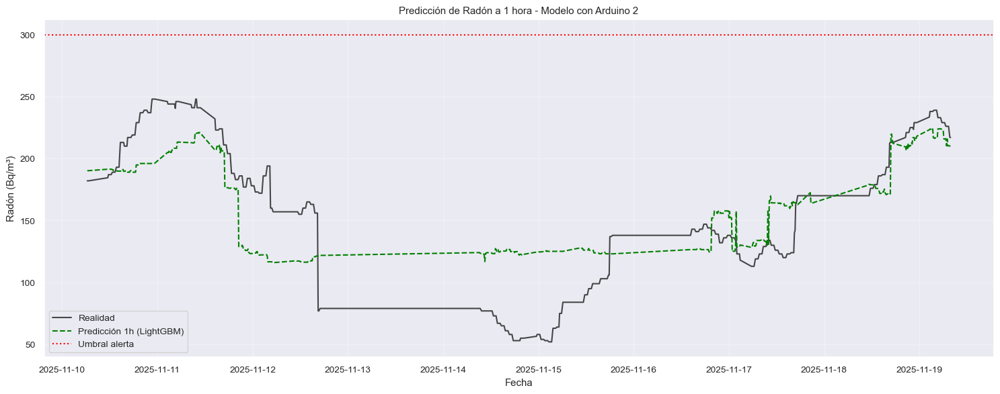

In [72]:
datetime_test = df_temp.index[split_idx:]

plt.figure(figsize=(15, 6))
plt.plot(datetime_test, y_test.values, label='Realidad', color='black', alpha=0.7)
plt.plot(datetime_test, y_pred, label='Predicción 1h (LightGBM)', color='green', linestyle='--')
plt.axhline(y=300, color='red', linestyle=':', label='Umbral alerta')
plt.title('Predicción de Radón a 1 hora - Modelo con Arduino 2')
plt.xlabel('Fecha')
plt.ylabel('Radón (Bq/m³)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


Se puede ver que el modelo captura bien la tendencia general, con errores que alternan entre sobreestimación y subestimación, lo cual es normal para los datos de los que se ha partido.

## **Cálculo del sesgo**

Sesgo medio: -1.6 Bq/m³
Desviación estándar del error: 37.9 Bq/m³
Error mínimo: -73.1 Bq/m³
Error máximo: 77.4 Bq/m³
Percentil 25: -34.2 Bq/m³
Percentil 75: 27.9 Bq/m³


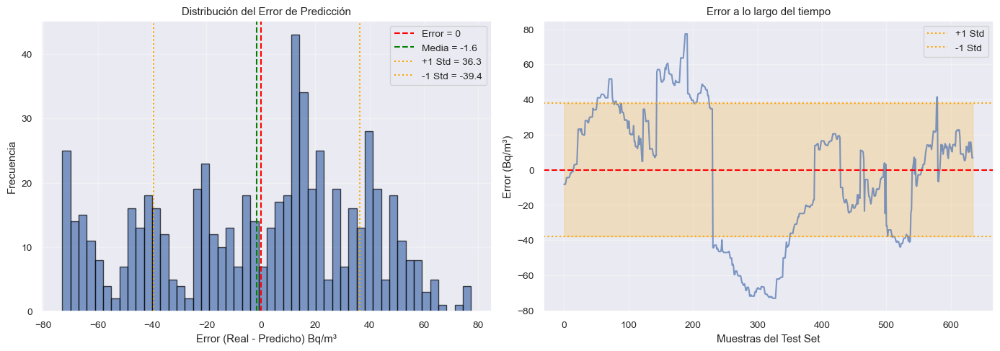


Porcentaje de errores:
  Dentro de ±20 Bq/m³: 36.4%
  Dentro de ±30 Bq/m³: 50.2%
  Dentro de ±50 Bq/m³: 79.5%


In [73]:
# Analizar la distribución del error
diferencia = y_test.values - y_pred

print(f"Sesgo medio: {diferencia.mean():.1f} Bq/m³")
print(f"Desviación estándar del error: {diferencia.std():.1f} Bq/m³")
print(f"Error mínimo: {diferencia.min():.1f} Bq/m³")
print(f"Error máximo: {diferencia.max():.1f} Bq/m³")
print(f"Percentil 25: {np.percentile(diferencia, 25):.1f} Bq/m³")
print(f"Percentil 75: {np.percentile(diferencia, 75):.1f} Bq/m³")

# Histograma del error
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histograma
axes[0].hist(diferencia, bins=50, edgecolor='black', alpha=0.7)
axes[0].axvline(x=0, color='red', linestyle='--', label='Error = 0')
axes[0].axvline(x=diferencia.mean(), color='green', linestyle='--', label=f'Media = {diferencia.mean():.1f}')
axes[0].axvline(x=diferencia.mean() + diferencia.std(), color='orange', linestyle=':', label=f'+1 Std = {diferencia.mean() + diferencia.std():.1f}')
axes[0].axvline(x=diferencia.mean() - diferencia.std(), color='orange', linestyle=':', label=f'-1 Std = {diferencia.mean() - diferencia.std():.1f}')
axes[0].set_xlabel('Error (Real - Predicho) Bq/m³')
axes[0].set_ylabel('Frecuencia')
axes[0].set_title('Distribución del Error de Predicción')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Error a lo largo del tiempo
axes[1].plot(diferencia, alpha=0.7)
axes[1].axhline(y=0, color='red', linestyle='--')
axes[1].axhline(y=diferencia.std(), color='orange', linestyle=':', label=f'+1 Std')
axes[1].axhline(y=-diferencia.std(), color='orange', linestyle=':', label=f'-1 Std')
axes[1].fill_between(range(len(diferencia)), -diferencia.std(), diferencia.std(), alpha=0.2, color='orange')
axes[1].set_xlabel('Muestras del Test Set')
axes[1].set_ylabel('Error (Bq/m³)')
axes[1].set_title('Error a lo largo del tiempo')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Porcentaje de predicciones dentro de rangos de error
print(f"\nPorcentaje de errores:")
print(f"  Dentro de ±20 Bq/m³: {(np.abs(diferencia) <= 20).mean()*100:.1f}%")
print(f"  Dentro de ±30 Bq/m³: {(np.abs(diferencia) <= 30).mean()*100:.1f}%")
print(f"  Dentro de ±50 Bq/m³: {(np.abs(diferencia) <= 50).mean()*100:.1f}%")

El sesgo de -1.6 Bq/m³ es aceptable, e indica que el modelo tiende a sobreestimar un poco las predicciones, lo cual habrá que tener en cuenta a la hora de generar las alertas

**Guardar el modelo**

In [74]:
import joblib

# Modelo entrenado
joblib.dump(modelo_lgbm, 'modelo_radon_lgbm_1h.pkl')

# Orden de las variables (CRÍTICO)
joblib.dump(list(features_minimas), 'features_orden.pkl')

# Metadatos 
metadata = {
    'horizonte': '1h',
    'horizonte_periodos': 6,
    'fecha_entrenamiento': '2026-02-18',
    'r2_test': 0.592,
    'mae_test': 31.9,
    'features': list(features_minimas),
    'descripcion_features': {
        'SHT85_Humedad_r': 'Humedad interior actual (%)',
        'Presion_meteo': 'Presión atmosférica actual (hPa)',
        'SHT85_Temp': 'Temperatura interior actual (°C)',
        'Humedad_Lag_4h': 'Humedad interior hace 4 horas (%)',
        'Presion_Lag_6h': 'Presión atmosférica hace 6 horas (hPa)',
        'Temp_Int_Media_10h': 'Media temperatura interior últimas 10h (°C)',
        'Hora_Sin': 'Componente seno de la hora',
        'Hora_Cos': 'Componente coseno de la hora'
    }
}
joblib.dump(metadata, 'modelo_metadata.pkl')

print("Guardado:")
print(f"  - modelo_radon_lgbm_1h.pkl")
print(f"  - features_orden.pkl") 
print(f"  - modelo_metadata.pkl")
print(f"\nFeatures en orden: {list(features_minimas)}")

Guardado:
  - modelo_radon_lgbm_1h.pkl
  - features_orden.pkl
  - modelo_metadata.pkl

Features en orden: ['SHT85_Humedad_r', 'Presion_meteo', 'SHT85_Temp', 'Humedad_Lag_4h', 'Presion_Lag_6h', 'Temp_Int_Media_10h', 'Hora_Sin', 'Hora_Cos']
